# Klasifikasi Fase Meiosis Berdasarkan Analisis Spasial Benang Spindel dan Kromosom Menggunakan OpenCV

Notebook ini membuat pipeline komputasi untuk topik **siklus sel dan meiosis**.
Data utama memakai Kaggle dataset `hasan1101/mitosis-detection`.

## Catatan ilmiah penting

Dataset tersebut adalah dataset **deteksi mitosis**, bukan dataset fase meiosis asli.
Dataset ini tidak menyediakan label fase meiosis seperti profase, metafase, anafase, dan telofase.
Karena itu notebook ini menyediakan dua mode label.

1. **Mode label manual**  
   Pakai `manual_phase_labels.csv` jika kelompok membuat label fase sendiri.
   Mode ini paling kuat untuk laporan ilmiah.

2. **Mode pseudo-label**  
   Jika label manual belum tersedia, notebook membuat label `meiosis-like` dari aturan berbasis fitur OpenCV.
   Mode ini cocok untuk demo metode, tetapi tidak boleh diklaim sebagai ground truth biologis.

## Target pseudo-label

- `non_dividing_like`
- `prophase_like`
- `metaphase_like`
- `anaphase_like`
- `telophase_like`

## Alur utama

1. Membaca dataset.
2. Melakukan EDA awal citra.
3. Melakukan preprocessing OpenCV.
4. Mensegmentasi area kromatin atau kromosom.
5. Mendeteksi struktur garis `spindle-like`.
6. Mengekstrak fitur spasial.
7. Melakukan EDA fitur.
8. Membuat label manual atau pseudo-label.
9. Melatih model Random Forest.
10. Mengevaluasi model dengan metrik, confusion matrix, feature importance, dan visualisasi prediksi.

## 1. Instalasi dan import library

Jalankan sel ini satu kali.
Pada Kaggle atau Google Colab, sebagian besar library biasanya sudah tersedia.

In [ ]:
import importlib.util
import subprocess
import sys

REQUIRED_PACKAGES = {
    "cv2": "opencv-python-headless",
    "numpy": "numpy",
    "pandas": "pandas",
    "matplotlib": "matplotlib",
    "sklearn": "scikit-learn",
    "joblib": "joblib",
    "kagglehub": "kagglehub",
}

for module_name, pip_name in REQUIRED_PACKAGES.items():
    if importlib.util.find_spec(module_name) is None:
        print(f"Installing {pip_name} ...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pip_name])

print("Setup package selesai.")


Setup package selesai.


In [ ]:
from pathlib import Path
import os
import math
import json
import random
import warnings

import cv2
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
)
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

warnings.filterwarnings("ignore")

RANDOM_STATE = 42
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

print("Library berhasil diimport.")


Library berhasil diimport.


## 2. Konfigurasi proyek

Ubah nilai konfigurasi sesuai kebutuhan.

- `MAX_IMAGES_PER_SOURCE_CLASS` membatasi jumlah data per folder sumber.
- `MAX_EDA_IMAGES` membatasi jumlah citra untuk EDA metadata agar notebook tetap ringan.
- `MANUAL_LABEL_CSV` dipakai jika kelompok membuat label fase sendiri.
- `IMAGE_SIZE` menentukan ukuran citra setelah resize dan padding.

In [ ]:
DATASET_SLUG = "hasan1101/mitosis-detection"
IMAGE_EXTENSIONS = {".png", ".jpg", ".jpeg", ".tif", ".tiff", ".bmp"}

IMAGE_SIZE = 256
MAX_IMAGES_PER_SOURCE_CLASS = None   # Contoh: 500. Pakai None untuk semua data.
MAX_EDA_IMAGES = 1500                # Batas gambar untuk EDA metadata.
MAX_VISUAL_PER_GROUP = 4             # Jumlah contoh citra per kelas pada galeri.

OUTPUT_DIR = Path("outputs_meiosis_opencv")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MANUAL_LABEL_CSV = Path("manual_phase_labels.csv")
USE_MANUAL_LABELS = MANUAL_LABEL_CSV.exists()

PSEUDO_PHASE_CLASSES = [
    "non_dividing_like",
    "prophase_like",
    "metaphase_like",
    "anaphase_like",
    "telophase_like",
]

print("OUTPUT_DIR:", OUTPUT_DIR.resolve())
print("USE_MANUAL_LABELS:", USE_MANUAL_LABELS)


OUTPUT_DIR: /content/outputs_meiosis_opencv
USE_MANUAL_LABELS: False


## 3. Unduh atau temukan dataset Kaggle

Notebook akan mencari dataset di beberapa lokasi umum.
Jika tidak ditemukan, notebook mencoba mengunduh dataset memakai `kagglehub`.

Pada Kaggle Notebook, tambahkan dataset **Mitosis Detection** ke tab input.
Pada Google Colab atau lokal, login Kaggle mungkin dibutuhkan jika unduhan gagal.

In [ ]:
def find_or_download_dataset(dataset_slug=DATASET_SLUG):
    candidate_roots = [
        Path("/kaggle/input/mitosis-detection"),
        Path("/kaggle/input"),
        Path("/content/mitosis-detection"),
        Path("./mitosis-detection"),
        Path("./data/mitosis-detection"),
    ]

    for root in candidate_roots:
        if root.exists():
            image_count = sum(1 for p in root.rglob("*") if p.suffix.lower() in IMAGE_EXTENSIONS)
            if image_count > 0:
                print(f"Dataset ditemukan di: {root}")
                print(f"Jumlah file gambar terdeteksi: {image_count}")
                return root

    print("Dataset belum ditemukan secara lokal. Mencoba download dengan kagglehub ...")
    try:
        import kagglehub
        downloaded_path = Path(kagglehub.dataset_download(dataset_slug))
        print(f"Dataset berhasil diunduh ke: {downloaded_path}")
        return downloaded_path
    except Exception as exc:
        raise RuntimeError(
            "Dataset belum bisa diakses. Tambahkan dataset ke Kaggle Notebook, "
            "atau pastikan kagglehub dan kredensial Kaggle sudah benar. "
            f"Error asli: {exc}"
        )

DATASET_ROOT = find_or_download_dataset()
DATASET_ROOT


Dataset belum ditemukan secara lokal. Mencoba download dengan kagglehub ...


100%|██████████| 614M/614M [00:28<00:00, 22.4MB/s]

Extracting files...


Dataset berhasil diunduh ke: /root/.cache/kagglehub/datasets/hasan1101/mitosis-detection/versions/10


PosixPath('/root/.cache/kagglehub/datasets/hasan1101/mitosis-detection/versions/10')

## 4. Indeks file gambar

Sel ini mencari seluruh file gambar secara rekursif, lalu menebak label folder sumber.
Label folder sumber tidak sama dengan fase meiosis.
Label ini hanya metadata awal dari dataset.

In [ ]:
def infer_source_label(path):
    parts = [part.lower() for part in Path(path).parts]
    joined = "/".join(parts)

    if "negative" in joined or "negatives" in joined or "non-mitotic" in joined or "non_mitotic" in joined:
        return "negative"
    if "mitotic" in joined or "mitosis" in joined:
        if "hard" not in joined:
            return "mitotic"
    if "hard" in joined:
        return "hard"
    return "unknown"

image_paths = sorted([p for p in DATASET_ROOT.rglob("*") if p.suffix.lower() in IMAGE_EXTENSIONS])

if len(image_paths) == 0:
    raise FileNotFoundError(f"Tidak ada file gambar ditemukan di {DATASET_ROOT}")

records = []
for path in image_paths:
    records.append({
        "image_path": str(path),
        "file_name": path.name,
        "source_label": infer_source_label(path),
        "parent_folder": path.parent.name,
        "extension": path.suffix.lower(),
        "file_size_bytes": path.stat().st_size if path.exists() else np.nan,
    })

df_images = pd.DataFrame(records).drop_duplicates(subset=["image_path"]).reset_index(drop=True)

if MAX_IMAGES_PER_SOURCE_CLASS is not None:
    df_images = (
        df_images.groupby("source_label", group_keys=False)
        .apply(lambda x: x.sample(n=min(len(x), MAX_IMAGES_PER_SOURCE_CLASS), random_state=RANDOM_STATE))
        .reset_index(drop=True)
    )

print("Jumlah gambar dipakai:", len(df_images))
display(df_images.head())
display(df_images["source_label"].value_counts().rename_axis("source_label").reset_index(name="count"))


Jumlah gambar dipakai: 26119


,image_path,file_name,source_label,parent_folder,extension,file_size_bytes
0,/root/.cache/kagglehub/datasets/hasan1101/mito...,0.png,negative,Negatives-100,.png,14440
1,/root/.cache/kagglehub/datasets/hasan1101/mito...,1.png,negative,Negatives-100,.png,18541
2,/root/.cache/kagglehub/datasets/hasan1101/mito...,10.png,negative,Negatives-100,.png,20279
3,/root/.cache/kagglehub/datasets/hasan1101/mito...,100.png,negative,Negatives-100,.png,21698
4,/root/.cache/kagglehub/datasets/hasan1101/mito...,1000.png,negative,Negatives-100,.png,21806


,source_label,count
0,mitotic,10256
1,hard,8776
2,negative,7087


## 5. EDA awal dataset dan metadata gambar

Bagian ini memeriksa komposisi dataset sebelum model dibuat.
EDA awal membantu menjelaskan bias data, ukuran citra, format file, dan kualitas intensitas.

In [ ]:
def make_eda_sample(df, max_images=MAX_EDA_IMAGES):
    """Ambil sampel EDA yang relatif seimbang berdasarkan source_label."""
    if max_images is None or len(df) <= max_images:
        return df.copy().reset_index(drop=True)

    group_count = max(1, df["source_label"].nunique())
    per_group = max(1, math.ceil(max_images / group_count))
    sampled = (
        df.groupby("source_label", group_keys=False)
        .apply(lambda x: x.sample(n=min(len(x), per_group), random_state=RANDOM_STATE))
        .reset_index(drop=True)
    )

    if len(sampled) > max_images:
        sampled = sampled.sample(n=max_images, random_state=RANDOM_STATE).reset_index(drop=True)
    return sampled


def build_image_metadata(df):
    rows = []
    for _, row in df.reset_index(drop=True).iterrows():
        path = Path(row["image_path"])
        image = cv2.imread(str(path), cv2.IMREAD_COLOR)
        if image is None:
            continue

        h, w = image.shape[:2]
        channels = image.shape[2] if image.ndim == 3 else 1
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if channels == 3 else image
        b_mean, g_mean, r_mean = np.nan, np.nan, np.nan
        if channels == 3:
            b_mean, g_mean, r_mean = image.reshape(-1, 3).mean(axis=0).astype(float)

        record = row.to_dict()
        record.update({
            "width": int(w),
            "height": int(h),
            "channels": int(channels),
            "aspect_ratio": float(w / h) if h > 0 else np.nan,
            "pixel_count": int(w * h),
            "file_size_kb": float(path.stat().st_size / 1024) if path.exists() else np.nan,
            "gray_mean": float(gray.mean()),
            "gray_std": float(gray.std()),
            "gray_min": int(gray.min()),
            "gray_max": int(gray.max()),
            "dark_pixel_ratio": float((gray < 100).mean()),
            "bright_pixel_ratio": float((gray > 220).mean()),
            "b_mean": float(b_mean),
            "g_mean": float(g_mean),
            "r_mean": float(r_mean),
        })
        rows.append(record)

    return pd.DataFrame(rows)


EDA_METADATA_CACHE = OUTPUT_DIR / "eda_image_metadata.csv"
df_eda_source = make_eda_sample(df_images, MAX_EDA_IMAGES)

if EDA_METADATA_CACHE.exists():
    cached_eda = pd.read_csv(EDA_METADATA_CACHE)
    needed_paths = set(df_eda_source["image_path"].astype(str))
    cached_paths = set(cached_eda.get("image_path", pd.Series(dtype=str)).astype(str))
    if needed_paths.issubset(cached_paths):
        eda_meta_df = cached_eda[cached_eda["image_path"].astype(str).isin(needed_paths)].copy()
        print(f"Metadata EDA dibaca dari cache: {EDA_METADATA_CACHE}")
    else:
        eda_meta_df = build_image_metadata(df_eda_source)
        eda_meta_df.to_csv(EDA_METADATA_CACHE, index=False)
else:
    eda_meta_df = build_image_metadata(df_eda_source)
    eda_meta_df.to_csv(EDA_METADATA_CACHE, index=False)

print("Jumlah seluruh gambar:", len(df_images))
print("Jumlah gambar untuk EDA metadata:", len(eda_meta_df))

source_counts = df_images["source_label"].value_counts().rename_axis("source_label").reset_index(name="count")
display(source_counts)

display(
    eda_meta_df[[
        "width", "height", "aspect_ratio", "pixel_count", "file_size_kb",
        "gray_mean", "gray_std", "dark_pixel_ratio", "bright_pixel_ratio"
    ]].describe().T.round(3)
)

display(eda_meta_df.head())


Jumlah seluruh gambar: 26119
Jumlah gambar untuk EDA metadata: 1500


,source_label,count
0,mitotic,10256
1,hard,8776
2,negative,7087


,count,mean,std,min,25%,50%,75%,max
width,1500.0,99.837,3.413,15.000,100.000,100.000,100.000,100.000
height,1500.0,99.004,8.259,7.000,100.000,100.000,100.000,100.000
aspect_ratio,1500.0,1.045,0.527,0.150,1.000,1.000,1.000,14.286
pixel_count,1500.0,9884.133,891.836,700.000,10000.000,10000.000,10000.000,10000.000
file_size_kb,1500.0,21.534,3.367,1.654,20.004,22.050,23.817,26.427
gray_mean,1500.0,143.053,27.308,68.745,122.100,141.829,162.579,238.188
gray_std,1500.0,40.591,9.793,0.669,34.236,40.723,47.069,74.008
dark_pixel_ratio,1500.0,0.211,0.173,0.000,0.064,0.175,0.318,0.838
bright_pixel_ratio,1500.0,0.080,0.124,0.000,0.010,0.038,0.093,1.000


,image_path,file_name,source_label,parent_folder,extension,file_size_bytes,width,height,channels,aspect_ratio,...,file_size_kb,gray_mean,gray_std,gray_min,gray_max,dark_pixel_ratio,bright_pixel_ratio,b_mean,g_mean,r_mean
0,/root/.cache/kagglehub/datasets/hasan1101/mito...,15191.png,hard,hard,.png,22509,100,100,3,1.0,...,21.981445,151.2884,55.625387,27,251,0.2127,0.1128,166.4280,135.9182,175.6788
1,/root/.cache/kagglehub/datasets/hasan1101/mito...,1462.png,hard,hard,.png,17800,100,100,3,1.0,...,17.382812,173.9815,33.999117,21,244,0.0430,0.0527,190.7037,149.9539,214.7096
2,/root/.cache/kagglehub/datasets/hasan1101/mito...,8963.png,hard,hard,.png,22736,100,100,3,1.0,...,22.203125,119.6439,30.845137,39,251,0.2688,0.0097,181.4065,79.2723,175.2834
3,/root/.cache/kagglehub/datasets/hasan1101/mito...,15954.png,hard,hard,.png,24063,100,100,3,1.0,...,23.499023,163.0406,49.500030,22,255,0.1289,0.1288,173.1504,145.9625,192.7045
4,/root/.cache/kagglehub/datasets/hasan1101/mito...,2605.png,hard,hard,.png,18512,100,100,3,1.0,...,18.078125,134.0155,42.188653,24,246,0.1497,0.0574,164.0805,105.0385,179.3337


## 6. Visualisasi EDA awal

Grafik ini menunjukkan distribusi label folder sumber, folder asal, format file, ukuran citra, dan karakter intensitas.
Gunakan grafik ini untuk menjelaskan kondisi awal dataset sebelum segmentasi OpenCV.

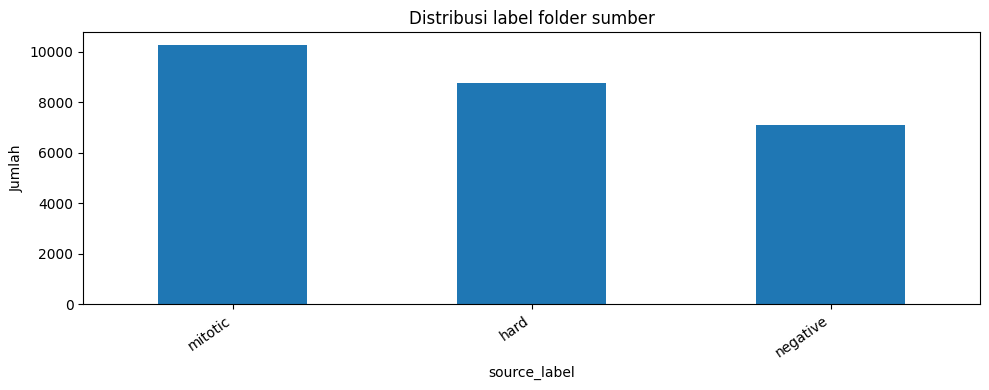

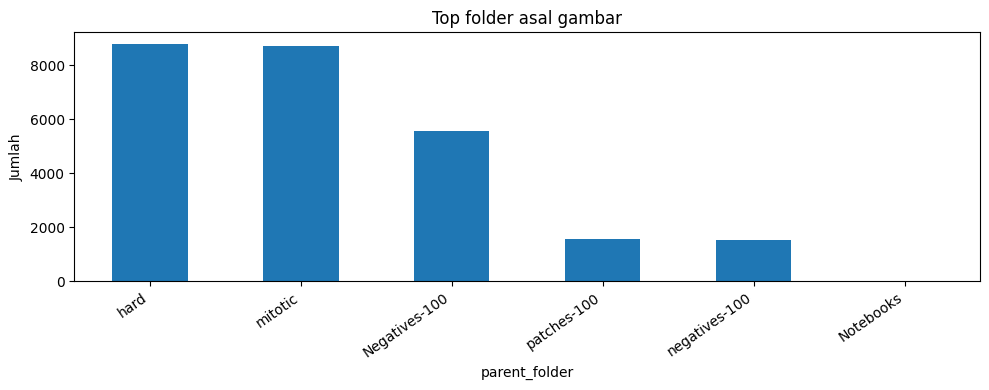

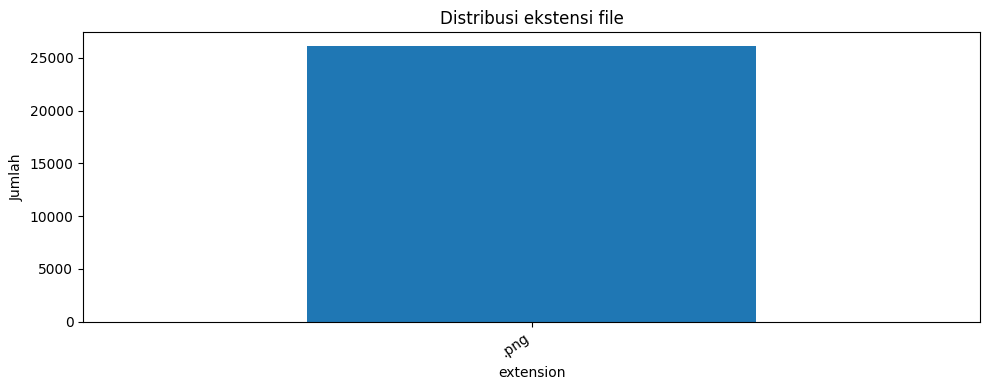

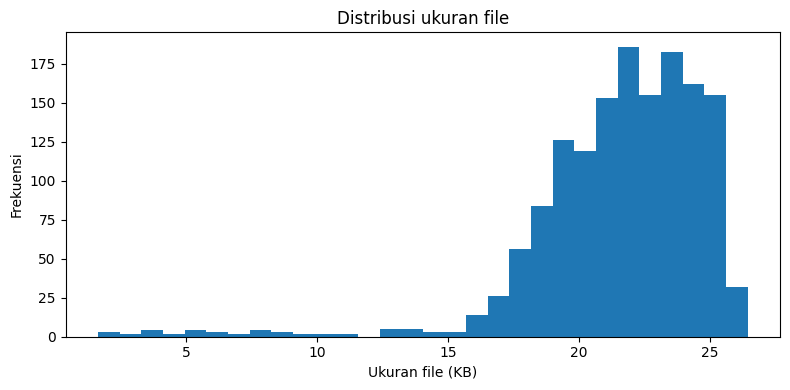

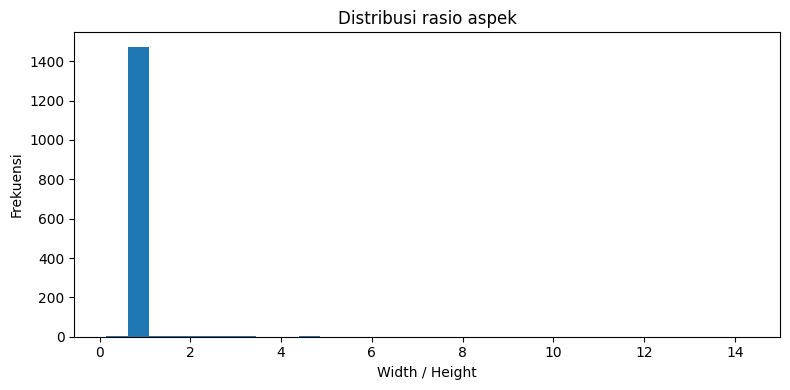

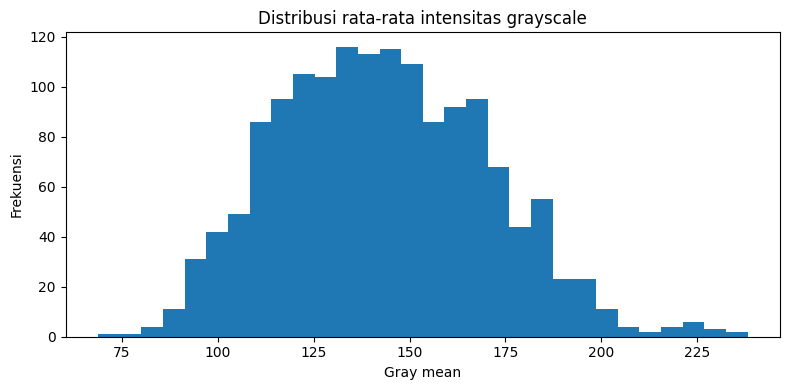

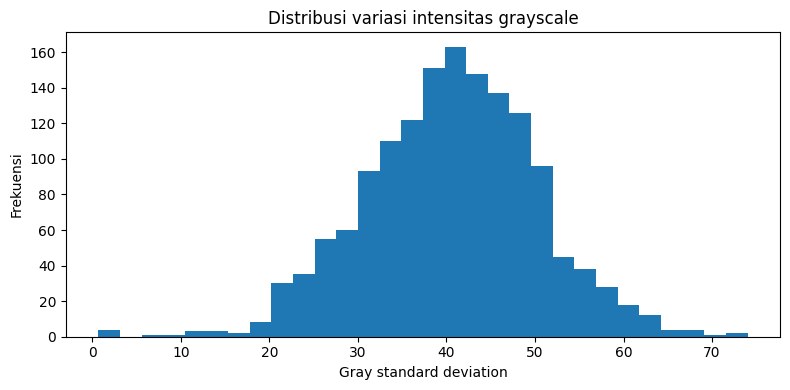

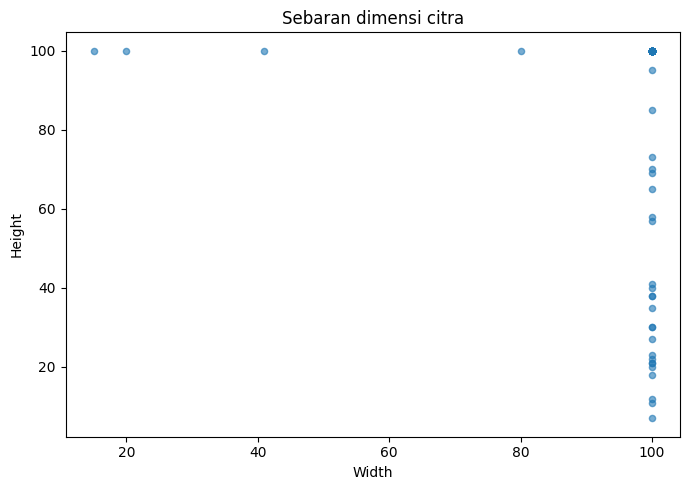

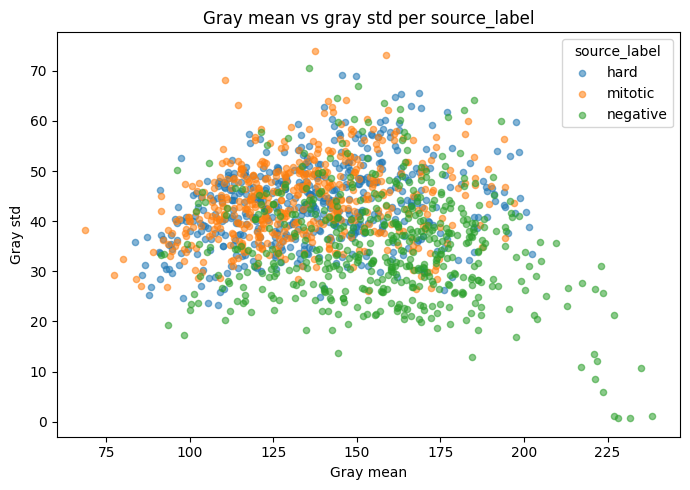

In [ ]:
def plot_value_counts(df, column, title, top_n=20, rotation=35):
    counts = df[column].value_counts().head(top_n)
    plt.figure(figsize=(10, 4))
    counts.plot(kind="bar")
    plt.title(title)
    plt.xlabel(column)
    plt.ylabel("Jumlah")
    plt.xticks(rotation=rotation, ha="right")
    plt.tight_layout()
    plt.show()


def plot_histogram(series, title, xlabel, bins=30):
    values = pd.to_numeric(series, errors="coerce").dropna()
    if values.empty:
        print(f"Tidak ada data numerik untuk {xlabel}.")
        return
    plt.figure(figsize=(8, 4))
    plt.hist(values, bins=bins)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel("Frekuensi")
    plt.tight_layout()
    plt.show()


plot_value_counts(df_images, "source_label", "Distribusi label folder sumber")
plot_value_counts(df_images, "parent_folder", "Top folder asal gambar", top_n=15)
plot_value_counts(df_images, "extension", "Distribusi ekstensi file")

plot_histogram(eda_meta_df["file_size_kb"], "Distribusi ukuran file", "Ukuran file (KB)")
plot_histogram(eda_meta_df["aspect_ratio"], "Distribusi rasio aspek", "Width / Height")
plot_histogram(eda_meta_df["gray_mean"], "Distribusi rata-rata intensitas grayscale", "Gray mean")
plot_histogram(eda_meta_df["gray_std"], "Distribusi variasi intensitas grayscale", "Gray standard deviation")

plt.figure(figsize=(7, 5))
plt.scatter(eda_meta_df["width"], eda_meta_df["height"], alpha=0.6, s=20)
plt.title("Sebaran dimensi citra")
plt.xlabel("Width")
plt.ylabel("Height")
plt.tight_layout()
plt.show()

plt.figure(figsize=(7, 5))
for label, group in eda_meta_df.groupby("source_label"):
    plt.scatter(group["gray_mean"], group["gray_std"], alpha=0.55, s=20, label=label)
plt.title("Gray mean vs gray std per source_label")
plt.xlabel("Gray mean")
plt.ylabel("Gray std")
plt.legend(title="source_label")
plt.tight_layout()
plt.show()


## 7. Fungsi baca citra dan preview

Sel ini memastikan dataset terbaca dengan benar.
Citra di-resize dengan padding agar ukuran konsisten untuk ekstraksi fitur.

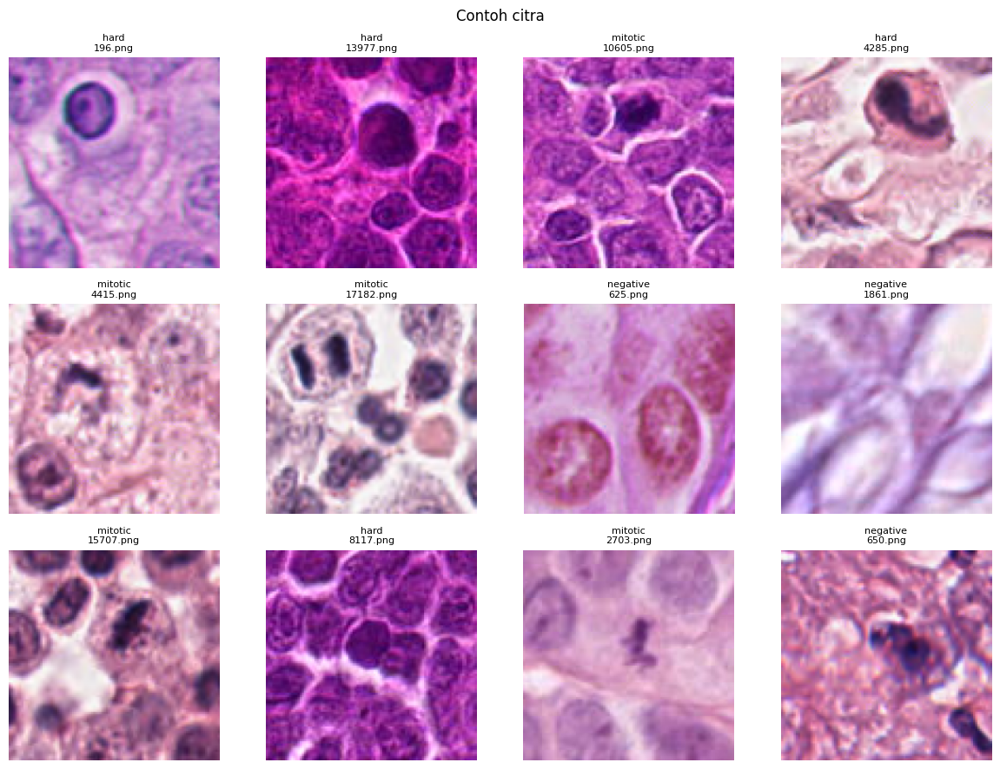

In [ ]:
def read_bgr(path, image_size=IMAGE_SIZE):
    path = Path(path)
    image = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if image is None:
        raise ValueError(f"Gagal membaca gambar: {path}")

    if image_size is None:
        return image

    h, w = image.shape[:2]
    scale = image_size / max(h, w)
    new_w = max(1, int(round(w * scale)))
    new_h = max(1, int(round(h * scale)))
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)

    canvas = np.full((image_size, image_size, 3), 255, dtype=np.uint8)
    y0 = (image_size - new_h) // 2
    x0 = (image_size - new_w) // 2
    canvas[y0:y0 + new_h, x0:x0 + new_w] = resized
    return canvas


def show_image_grid(df, n=12, title="Contoh citra"):
    n = min(n, len(df))
    sample_df = df.sample(n=n, random_state=RANDOM_STATE) if len(df) > n else df.copy()
    cols = 4
    rows = int(math.ceil(n / cols))
    plt.figure(figsize=(cols * 3, rows * 3))

    for idx, (_, row) in enumerate(sample_df.iterrows(), start=1):
        bgr = read_bgr(row["image_path"])
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, idx)
        plt.imshow(rgb)
        plt.title(f"{row['source_label']}\n{row['file_name'][:18]}", fontsize=8)
        plt.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

show_image_grid(df_images, n=12)


## 8. Tahap preprocessing citra

Tahap ini menyiapkan citra mikroskop agar struktur kromatin, kromosom, dan garis tipis yang menyerupai benang spindel lebih mudah dianalisis. Preprocessing dilakukan sebelum segmentasi dan ekstraksi fitur.

Langkah yang digunakan:

1. **Resize dan padding** agar semua gambar memiliki ukuran seragam.
2. **Konversi grayscale** untuk analisis intensitas.
3. **Denoising median blur** untuk mengurangi noise kecil.
4. **CLAHE** untuk meningkatkan kontras lokal.
5. **Background correction** untuk mengurangi pengaruh pencahayaan tidak merata.
6. **Normalisasi intensitas** agar rentang piksel lebih stabil.
7. **Sharpening ringan** untuk memperjelas tepi objek biologis.

Output preprocessing dipakai oleh fungsi segmentasi kromatin dan deteksi garis `spindle-like` pada tahap berikutnya.

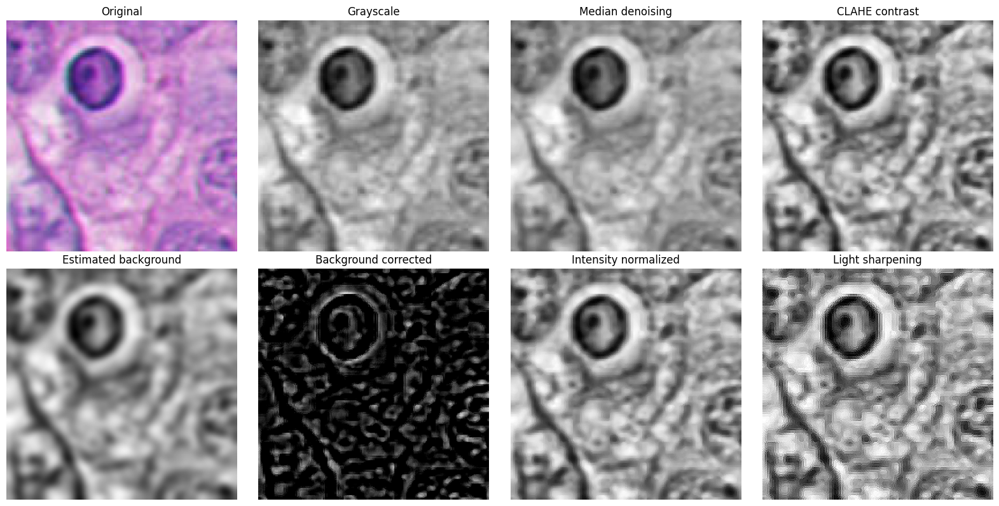

,value
gray_mean,157.916977
gray_std,29.958090
clahe_mean,150.763138
clahe_std,44.482994
background_corrected_mean,24.457809
background_corrected_std,33.967186
sharpened_mean,147.925003
sharpened_std,53.985470
contrast_gain_clahe,1.484841
contrast_gain_background_corrected,1.133824


In [ ]:
def preprocess_microscopy_image(bgr):
    """Preprocessing citra mikroskop sebelum segmentasi dan ekstraksi fitur.

    Parameter
    ---------
    bgr : np.ndarray
        Citra input dalam format BGR dari OpenCV.

    Return
    ------
    dict
        Kumpulan citra antara yang digunakan untuk segmentasi, edge detection,
        dan visualisasi pipeline.
    """
    if bgr is None:
        raise ValueError("Input bgr tidak boleh None")

    # 1. Grayscale untuk analisis intensitas.
    gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)

    # 2. Median blur menjaga tepi lebih baik dibanding blur rata-rata.
    denoised = cv2.medianBlur(gray, 3)

    # 3. CLAHE memperkuat kontras lokal kromatin/kromosom.
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_gray = clahe.apply(denoised)

    # 4. Koreksi background dengan estimasi pencahayaan lokal.
    # Kernel dibuat ganjil dan proporsional terhadap ukuran gambar.
    h, w = gray.shape[:2]
    kernel_size = max(15, int(round(min(h, w) * 0.08)))
    if kernel_size % 2 == 0:
        kernel_size += 1
    background = cv2.GaussianBlur(clahe_gray, (kernel_size, kernel_size), 0)
    background_corrected = cv2.subtract(clahe_gray, background)
    background_corrected = cv2.normalize(background_corrected, None, 0, 255, cv2.NORM_MINMAX)
    background_corrected = background_corrected.astype(np.uint8)

    # 5. Normalisasi intensitas final.
    normalized = cv2.normalize(clahe_gray, None, 0, 255, cv2.NORM_MINMAX)
    normalized = normalized.astype(np.uint8)

    # 6. Sharpening ringan untuk membantu deteksi kontur dan garis halus.
    sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=np.float32)
    sharpened = cv2.filter2D(normalized, -1, sharpen_kernel)

    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)
    saturation = hsv[:, :, 1]

    return {
        "gray": gray,
        "denoised": denoised,
        "clahe_gray": clahe_gray,
        "background": background,
        "background_corrected": background_corrected,
        "normalized": normalized,
        "sharpened": sharpened,
        "saturation": saturation,
        "edge_input": sharpened,
    }


def preprocessing_quality_stats(prep):
    """Menghasilkan statistik sederhana untuk mengecek efek preprocessing."""
    gray = prep["gray"].astype(np.float32)
    clahe_gray = prep["clahe_gray"].astype(np.float32)
    background_corrected = prep["background_corrected"].astype(np.float32)
    sharpened = prep["sharpened"].astype(np.float32)

    return {
        "gray_mean": float(gray.mean()),
        "gray_std": float(gray.std()),
        "clahe_mean": float(clahe_gray.mean()),
        "clahe_std": float(clahe_gray.std()),
        "background_corrected_mean": float(background_corrected.mean()),
        "background_corrected_std": float(background_corrected.std()),
        "sharpened_mean": float(sharpened.mean()),
        "sharpened_std": float(sharpened.std()),
        "contrast_gain_clahe": float(clahe_gray.std() / gray.std()) if gray.std() > 1e-12 else 0.0,
        "contrast_gain_background_corrected": float(background_corrected.std() / gray.std()) if gray.std() > 1e-12 else 0.0,
    }


def visualize_preprocessing_steps(image_path):
    bgr = read_bgr(image_path)
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    prep = preprocess_microscopy_image(bgr)

    panels = [
        ("Original", rgb, None),
        ("Grayscale", prep["gray"], "gray"),
        ("Median denoising", prep["denoised"], "gray"),
        ("CLAHE contrast", prep["clahe_gray"], "gray"),
        ("Estimated background", prep["background"], "gray"),
        ("Background corrected", prep["background_corrected"], "gray"),
        ("Intensity normalized", prep["normalized"], "gray"),
        ("Light sharpening", prep["sharpened"], "gray"),
    ]

    plt.figure(figsize=(16, 8))
    for idx, (title, img, cmap) in enumerate(panels, start=1):
        plt.subplot(2, 4, idx)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

    stats = pd.DataFrame([preprocessing_quality_stats(prep)]).T.rename(columns={0: "value"})
    display(stats)


sample_path = df_images.sample(1, random_state=RANDOM_STATE)["image_path"].iloc[0]
visualize_preprocessing_steps(sample_path)


### 8.1. Visualisasi preprocessing per label sumber

Bagian ini membantu mengecek apakah tahap preprocessing bekerja konsisten pada beberapa contoh citra dari folder atau label sumber yang berbeda.

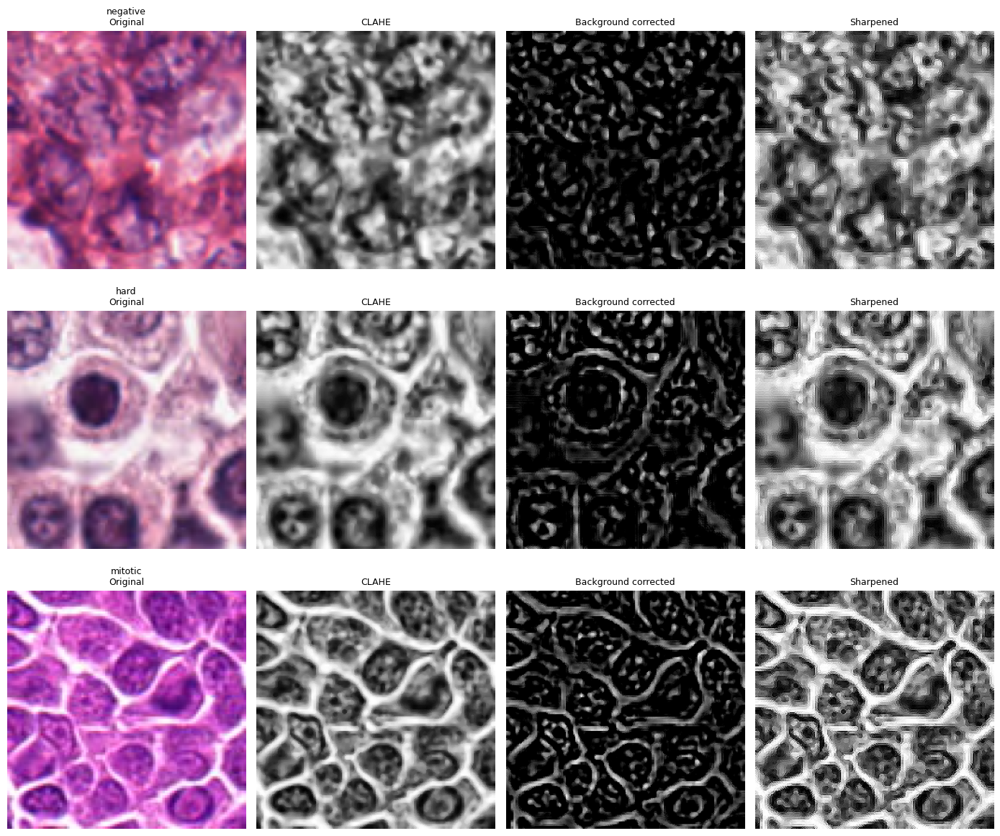

In [ ]:
def show_preprocessing_comparison_by_source(df, n_groups=3):
    groups = df["source_label"].dropna().unique().tolist()[:n_groups]
    if len(groups) == 0:
        print("Tidak ada source_label untuk divisualisasikan.")
        return

    plt.figure(figsize=(14, 4 * len(groups)))
    row_idx = 1
    for group in groups:
        subset = df[df["source_label"] == group]
        if subset.empty:
            continue
        image_path = subset.sample(1, random_state=RANDOM_STATE)["image_path"].iloc[0]
        bgr = read_bgr(image_path)
        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        prep = preprocess_microscopy_image(bgr)

        panels = [
            (f"{group}\nOriginal", rgb, None),
            ("CLAHE", prep["clahe_gray"], "gray"),
            ("Background corrected", prep["background_corrected"], "gray"),
            ("Sharpened", prep["sharpened"], "gray"),
        ]

        for title, img, cmap in panels:
            plt.subplot(len(groups), 4, row_idx)
            plt.imshow(img, cmap=cmap)
            plt.title(title, fontsize=9)
            plt.axis("off")
            row_idx += 1

    plt.tight_layout()
    plt.show()

show_preprocessing_comparison_by_source(df_images, n_groups=3)


## 9. Galeri citra per label folder sumber

Bagian ini membantu melihat variasi visual antar folder sumber.
Label masih berasal dari struktur folder dataset, bukan fase meiosis.

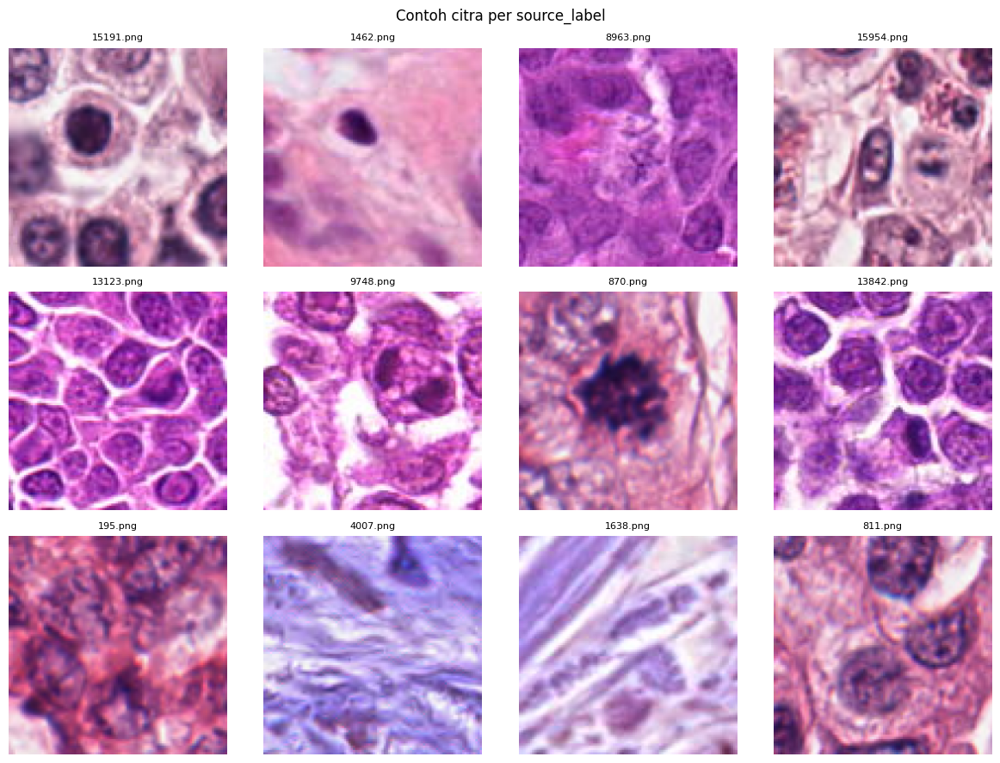

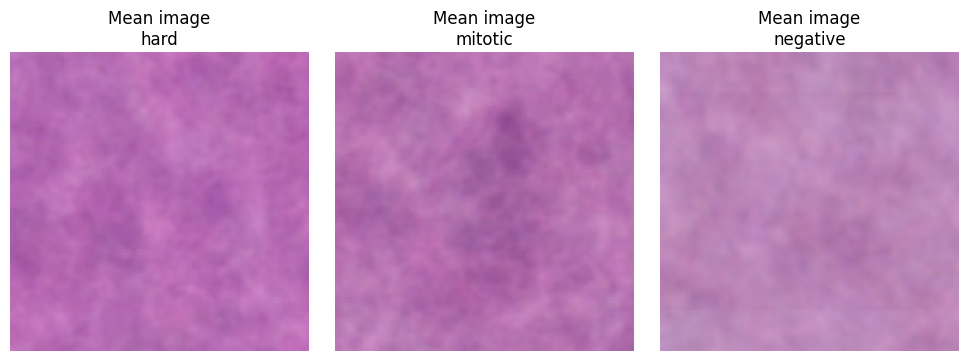

In [ ]:
def show_grouped_image_grid(df, group_col, n_per_group=MAX_VISUAL_PER_GROUP, title=None):
    groups = sorted(df[group_col].dropna().astype(str).unique().tolist())
    if len(groups) == 0:
        print(f"Kolom {group_col} tidak memiliki grup valid.")
        return

    n_per_group = max(1, int(n_per_group))
    fig, axes = plt.subplots(len(groups), n_per_group, figsize=(n_per_group * 3.0, len(groups) * 3.0), squeeze=False)

    for row_idx, group in enumerate(groups):
        group_df = df[df[group_col].astype(str) == group]
        sample_df = group_df.sample(n=min(n_per_group, len(group_df)), random_state=RANDOM_STATE)

        for col_idx in range(n_per_group):
            ax = axes[row_idx, col_idx]
            ax.axis("off")
            if col_idx >= len(sample_df):
                continue
            item = sample_df.iloc[col_idx]
            bgr = read_bgr(item["image_path"])
            rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            ax.imshow(rgb)
            ax.set_title(str(item.get("file_name", ""))[:18], fontsize=8)

        axes[row_idx, 0].set_ylabel(group, fontsize=10)

    fig.suptitle(title or f"Contoh citra per {group_col}")
    plt.tight_layout()
    plt.show()


def show_mean_image_by_group(df, group_col="source_label", max_images_per_group=40):
    groups = sorted(df[group_col].dropna().astype(str).unique().tolist())
    if len(groups) == 0:
        return

    plt.figure(figsize=(len(groups) * 3.3, 3.5))
    for idx, group in enumerate(groups, start=1):
        group_df = df[df[group_col].astype(str) == group]
        sample_df = group_df.sample(n=min(max_images_per_group, len(group_df)), random_state=RANDOM_STATE)
        images = []
        for path in sample_df["image_path"]:
            try:
                bgr = read_bgr(path)
                rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
                images.append(rgb)
            except Exception:
                continue

        plt.subplot(1, len(groups), idx)
        if images:
            mean_img = np.mean(images, axis=0).clip(0, 255).astype(np.uint8)
            plt.imshow(mean_img)
        plt.title(f"Mean image\n{group}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


show_grouped_image_grid(df_images, group_col="source_label", n_per_group=MAX_VISUAL_PER_GROUP)
show_mean_image_by_group(df_images, group_col="source_label", max_images_per_group=40)


## 10. Segmentasi kromatin atau kromosom dengan OpenCV

Tujuan tahap ini adalah memperoleh area gelap atau berwarna kuat yang diasumsikan sebagai kromatin atau kromosom.
Pada citra histopatologi H&E, area ini biasanya tampak lebih gelap.

Langkah utama:

1. Konversi citra ke grayscale dan HSV.
2. Tingkatkan kontras dengan CLAHE.
3. Gabungkan intensitas gelap dan saturasi warna.
4. Thresholding Otsu.
5. Bersihkan mask dengan operasi morfologi.
6. Filter kontur kecil dan terlalu besar.

In [ ]:
def find_contours(binary_mask):
    result = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(result) == 2:
        contours, _ = result
    else:
        _, contours, _ = result
    return contours


def segment_chromatin(bgr):
    h, w = bgr.shape[:2]
    prep = preprocess_microscopy_image(bgr)
    gray_eq = prep["clahe_gray"]
    background_corrected = prep["background_corrected"]
    saturation = prep["saturation"]

    # Kromatin/kromosom biasanya tampak lebih gelap dan padat.
    # Skor menggabungkan intensitas gelap, kontras hasil koreksi background,
    # dan saturasi warna agar lebih adaptif terhadap variasi pewarnaan citra.
    dark_score = 255 - gray_eq
    score = cv2.addWeighted(dark_score, 0.55, background_corrected, 0.30, 0)
    score = cv2.addWeighted(score, 0.78, saturation, 0.22, 0)
    score = cv2.GaussianBlur(score, (5, 5), 0)

    _, mask = cv2.threshold(score, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    mask_ratio = float(mask.sum() / 255) / (h * w)
    if mask_ratio > 0.65:
        threshold_value = np.percentile(score, 75)
        _, mask = cv2.threshold(score, threshold_value, 255, cv2.THRESH_BINARY)

    kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    kernel_medium = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))

    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_small, iterations=1)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel_medium, iterations=1)

    contours = find_contours(mask)
    clean_mask = np.zeros_like(mask)

    image_area = h * w
    min_area = max(8, int(0.0002 * image_area))
    max_area = int(0.75 * image_area)

    kept_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if min_area <= area <= max_area:
            kept_contours.append(contour)
            cv2.drawContours(clean_mask, [contour], -1, 255, thickness=-1)

    clean_mask = cv2.morphologyEx(clean_mask, cv2.MORPH_CLOSE, kernel_small, iterations=1)
    kept_contours = find_contours(clean_mask)

    return clean_mask, kept_contours, score


## 11. Deteksi struktur garis `spindle-like`

Benang spindle biologis biasanya membutuhkan pewarnaan atau kanal fluoresensi khusus.
Dataset ini bukan dataset spindle.
Karena itu fitur ini diperlakukan sebagai **tekstur garis yang mirip spindle**, bukan bukti visual spindle aktual.

Metode:

1. CLAHE pada grayscale.
2. Canny edge detection.
3. Kurangi edge yang menempel pada mask kromatin.
4. HoughLinesP untuk mendeteksi garis.
5. Hitung jumlah, panjang, orientasi, dan koherensi garis.

In [ ]:
def detect_spindle_like_lines(bgr, chromatin_mask):
    h, w = bgr.shape[:2]
    prep = preprocess_microscopy_image(bgr)
    edge_input = prep["edge_input"]
    blur = cv2.GaussianBlur(edge_input, (5, 5), 0)

    edges = cv2.Canny(blur, threshold1=45, threshold2=135)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    chromatin_dilated = cv2.dilate(chromatin_mask, kernel, iterations=1)
    candidate_edges = cv2.bitwise_and(edges, cv2.bitwise_not(chromatin_dilated))

    min_line_length = max(12, int(0.06 * max(h, w)))
    max_line_gap = max(3, int(0.02 * max(h, w)))

    lines = cv2.HoughLinesP(
        candidate_edges,
        rho=1,
        theta=np.pi / 180,
        threshold=18,
        minLineLength=min_line_length,
        maxLineGap=max_line_gap,
    )

    parsed_lines = []
    if lines is not None:
        for line in lines[:, 0, :]:
            x1, y1, x2, y2 = [int(v) for v in line]
            length = float(np.hypot(x2 - x1, y2 - y1))
            angle = float(np.arctan2(y2 - y1, x2 - x1))
            parsed_lines.append({
                "x1": x1,
                "y1": y1,
                "x2": x2,
                "y2": y2,
                "length": length,
                "angle": angle,
            })

    return parsed_lines, edges, candidate_edges


def summarize_lines(lines, image_shape):
    h, w = image_shape[:2]
    diag = float(np.hypot(h, w))

    if len(lines) == 0:
        return {
            "spindle_line_count": 0,
            "spindle_total_length_norm": 0.0,
            "spindle_mean_length_norm": 0.0,
            "spindle_angle_coherence": 0.0,
            "spindle_dominant_angle_rad": 0.0,
        }

    lengths = np.array([line["length"] for line in lines], dtype=float)
    angles = np.array([line["angle"] for line in lines], dtype=float)
    weights = lengths / (lengths.sum() + 1e-8)

    c = float(np.sum(weights * np.cos(2 * angles)))
    s = float(np.sum(weights * np.sin(2 * angles)))
    coherence = float(np.sqrt(c ** 2 + s ** 2))
    dominant_angle = float(0.5 * np.arctan2(s, c))

    return {
        "spindle_line_count": int(len(lines)),
        "spindle_total_length_norm": float(lengths.sum() / diag),
        "spindle_mean_length_norm": float(lengths.mean() / diag),
        "spindle_angle_coherence": coherence,
        "spindle_dominant_angle_rad": dominant_angle,
    }


## 12. Ekstraksi fitur spasial

Fitur yang diekstrak mencakup:

- Luas kromatin.
- Jumlah objek kromatin.
- Ukuran dan bentuk objek.
- Posisi pusat massa.
- Rasio sumbu utama dari PCA.
- Skor pita tengah untuk pola metafase.
- Pemisahan dua klaster untuk pola anafase atau telofase.
- Fitur garis `spindle-like`.
- Hubungan orientasi kromatin dengan orientasi garis.

In [ ]:
def safe_divide(a, b, default=0.0):
    return float(a / b) if abs(b) > 1e-12 else float(default)


def contour_measurements(contours, image_shape):
    h, w = image_shape[:2]
    image_area = h * w

    areas = []
    perimeters = []
    circularities = []
    centroids = []

    for contour in contours:
        area = float(cv2.contourArea(contour))
        perimeter = float(cv2.arcLength(contour, True))
        if area <= 0:
            continue

        moments = cv2.moments(contour)
        if moments["m00"] != 0:
            cx = float(moments["m10"] / moments["m00"])
            cy = float(moments["m01"] / moments["m00"])
        else:
            pts = contour.reshape(-1, 2)
            cx, cy = pts.mean(axis=0).astype(float)

        circularity = safe_divide(4 * math.pi * area, perimeter ** 2, default=0.0)

        areas.append(area)
        perimeters.append(perimeter)
        circularities.append(circularity)
        centroids.append([cx, cy])

    if len(areas) == 0:
        return {
            "object_count": 0,
            "mean_object_area_norm": 0.0,
            "std_object_area_norm": 0.0,
            "max_object_area_norm": 0.0,
            "mean_circularity": 0.0,
            "std_circularity": 0.0,
            "centroids": np.empty((0, 2), dtype=float),
        }

    areas = np.array(areas, dtype=float)
    circularities = np.array(circularities, dtype=float)

    return {
        "object_count": int(len(areas)),
        "mean_object_area_norm": float(areas.mean() / image_area),
        "std_object_area_norm": float(areas.std() / image_area),
        "max_object_area_norm": float(areas.max() / image_area),
        "mean_circularity": float(circularities.mean()),
        "std_circularity": float(circularities.std()),
        "centroids": np.array(centroids, dtype=float),
    }


def pca_spatial_features(points_xy, image_shape):
    h, w = image_shape[:2]
    diag = float(np.hypot(h, w))
    center_image = np.array([w / 2, h / 2], dtype=float)

    if points_xy.shape[0] < 3:
        return {
            "chromatin_centroid_x_norm": 0.5,
            "chromatin_centroid_y_norm": 0.5,
            "centroid_distance_to_center_norm": 0.0,
            "pca_axis_ratio": 1.0,
            "pca_major_span_norm": 0.0,
            "pca_minor_span_norm": 0.0,
            "pca_angle_rad": 0.0,
            "band_score": 0.0,
        }

    centroid = points_xy.mean(axis=0)
    centered = points_xy - centroid
    cov = np.cov(centered.T)
    eigvals, eigvecs = np.linalg.eigh(cov)
    order = np.argsort(eigvals)[::-1]
    eigvals = eigvals[order]
    eigvecs = eigvecs[:, order]

    major_vec = eigvecs[:, 0]
    minor_vec = eigvecs[:, 1]
    major_proj = centered @ major_vec
    minor_proj = centered @ minor_vec

    major_span = float(np.percentile(major_proj, 99) - np.percentile(major_proj, 1))
    minor_span = float(np.percentile(minor_proj, 99) - np.percentile(minor_proj, 1))
    axis_ratio = float(np.sqrt((eigvals[0] + 1e-8) / (eigvals[1] + 1e-8)))
    pca_angle = float(np.arctan2(major_vec[1], major_vec[0]))

    centroid_distance = float(np.linalg.norm(centroid - center_image) / diag)

    elongation_score = float(np.clip((axis_ratio - 1.0) / 5.0, 0, 1))
    thinness_score = float(1.0 / (1.0 + 5.0 * (minor_span / (diag + 1e-8))))
    centrality_score = float(np.exp(-5.0 * centroid_distance))
    band_score = float(elongation_score * thinness_score * centrality_score)

    return {
        "chromatin_centroid_x_norm": float(centroid[0] / w),
        "chromatin_centroid_y_norm": float(centroid[1] / h),
        "centroid_distance_to_center_norm": centroid_distance,
        "pca_axis_ratio": axis_ratio,
        "pca_major_span_norm": float(major_span / diag),
        "pca_minor_span_norm": float(minor_span / diag),
        "pca_angle_rad": pca_angle,
        "band_score": band_score,
    }


def two_cluster_features(points_xy, image_shape):
    h, w = image_shape[:2]
    diag = float(np.hypot(h, w))

    if points_xy.shape[0] < 6:
        return {
            "cluster_separation_norm": 0.0,
            "cluster_balance": 0.0,
            "cluster_compactness_norm": 0.0,
        }

    if points_xy.shape[0] > 1500:
        rng = np.random.default_rng(RANDOM_STATE)
        idx = rng.choice(points_xy.shape[0], size=1500, replace=False)
        points_sample = points_xy[idx]
    else:
        points_sample = points_xy

    try:
        kmeans = KMeans(n_clusters=2, random_state=RANDOM_STATE, n_init=10)
        labels = kmeans.fit_predict(points_sample)
        centers = kmeans.cluster_centers_
        counts = np.bincount(labels, minlength=2).astype(float)

        separation = float(np.linalg.norm(centers[0] - centers[1]) / diag)
        balance = float(counts.min() / (counts.max() + 1e-8))

        distances = np.linalg.norm(points_sample - centers[labels], axis=1)
        compactness = float(distances.mean() / diag)

        return {
            "cluster_separation_norm": separation,
            "cluster_balance": balance,
            "cluster_compactness_norm": compactness,
        }
    except Exception:
        return {
            "cluster_separation_norm": 0.0,
            "cluster_balance": 0.0,
            "cluster_compactness_norm": 0.0,
        }


def angle_alignment(angle_a, angle_b):
    diff = abs(float(angle_a) - float(angle_b))
    diff = min(diff, math.pi - diff) if diff <= math.pi else diff % math.pi
    return {
        "axis_line_alignment": float(abs(math.cos(diff))),
        "axis_line_perpendicularity": float(abs(math.sin(diff))),
    }


def extract_spatial_features(image_path, return_artifacts=False):
    bgr = read_bgr(image_path)
    h, w = bgr.shape[:2]
    image_area = h * w

    preprocessing_artifacts = preprocess_microscopy_image(bgr)
    preprocessing_stats = preprocessing_quality_stats(preprocessing_artifacts)

    chromatin_mask, contours, score = segment_chromatin(bgr)
    lines, edges, candidate_edges = detect_spindle_like_lines(bgr, chromatin_mask)

    mask_area = float(chromatin_mask.sum() / 255)
    ys, xs = np.where(chromatin_mask > 0)
    points_xy = np.column_stack([xs, ys]).astype(float) if len(xs) > 0 else np.empty((0, 2), dtype=float)

    contour_stats = contour_measurements(contours, bgr.shape)
    pca_stats = pca_spatial_features(points_xy, bgr.shape)
    cluster_stats = two_cluster_features(points_xy, bgr.shape)
    line_stats = summarize_lines(lines, bgr.shape)
    orientation_stats = angle_alignment(pca_stats["pca_angle_rad"], line_stats["spindle_dominant_angle_rad"])

    features = {
        "chromatin_area_ratio": float(mask_area / image_area),
        "edge_density": float((edges > 0).sum() / image_area),
        "candidate_line_edge_density": float((candidate_edges > 0).sum() / image_area),
    }
    features.update(preprocessing_stats)
    features.update({k: v for k, v in contour_stats.items() if k != "centroids"})
    features.update(pca_stats)
    features.update(cluster_stats)
    features.update(line_stats)
    features.update(orientation_stats)

    if not return_artifacts:
        return features

    artifacts = {
        "bgr": bgr,
        "preprocessing": preprocessing_artifacts,
        "chromatin_mask": chromatin_mask,
        "score": score,
        "contours": contours,
        "lines": lines,
        "edges": edges,
        "candidate_edges": candidate_edges,
    }
    return features, artifacts


## 13. Visualisasi pipeline OpenCV pada satu citra

Sel ini membantu mengecek apakah hasil segmentasi dan deteksi garis sudah masuk akal.
Jika mask terlalu luas atau terlalu sempit, ubah parameter di fungsi `segment_chromatin`.

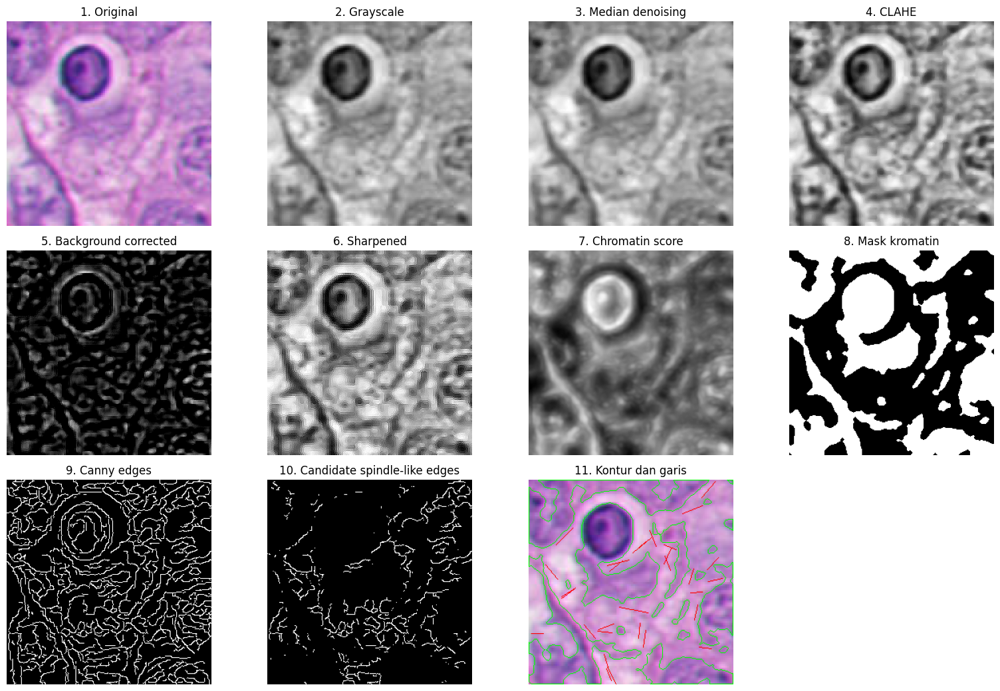

,value
chromatin_area_ratio,0.452347
edge_density,0.139069
candidate_line_edge_density,0.049530
gray_mean,157.916977
gray_std,29.958090
clahe_mean,150.763138
clahe_std,44.482994
background_corrected_mean,24.457809
background_corrected_std,33.967186
sharpened_mean,147.925003


In [ ]:
def visualize_opencv_steps(image_path):
    features, artifacts = extract_spatial_features(image_path, return_artifacts=True)
    bgr = artifacts["bgr"]
    prep = artifacts["preprocessing"]
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    overlay = bgr.copy()
    cv2.drawContours(overlay, artifacts["contours"], -1, (0, 255, 0), 1)
    for line in artifacts["lines"]:
        cv2.line(overlay, (line["x1"], line["y1"]), (line["x2"], line["y2"]), (0, 0, 255), 1)
    overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    panels = [
        ("1. Original", rgb, None),
        ("2. Grayscale", prep["gray"], "gray"),
        ("3. Median denoising", prep["denoised"], "gray"),
        ("4. CLAHE", prep["clahe_gray"], "gray"),
        ("5. Background corrected", prep["background_corrected"], "gray"),
        ("6. Sharpened", prep["sharpened"], "gray"),
        ("7. Chromatin score", artifacts["score"], "gray"),
        ("8. Mask kromatin", artifacts["chromatin_mask"], "gray"),
        ("9. Canny edges", artifacts["edges"], "gray"),
        ("10. Candidate spindle-like edges", artifacts["candidate_edges"], "gray"),
        ("11. Kontur dan garis", overlay_rgb, None),
    ]

    cols = 4
    rows = int(math.ceil(len(panels) / cols))
    plt.figure(figsize=(cols * 4, rows * 3.5))
    for idx, (title, img, cmap) in enumerate(panels, start=1):
        plt.subplot(rows, cols, idx)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

    display(pd.DataFrame([features]).T.rename(columns={0: "value"}))

sample_path = df_images.sample(1, random_state=RANDOM_STATE)["image_path"].iloc[0]
visualize_opencv_steps(sample_path)


## 14. Galeri overlay segmentasi dan garis spindle-like

Visualisasi ini menampilkan hasil OpenCV pada beberapa contoh citra.
Kontur hijau menunjukkan area kromatin atau kromosom yang tersegmentasi.
Garis merah menunjukkan struktur garis `spindle-like` dari Hough Transform.

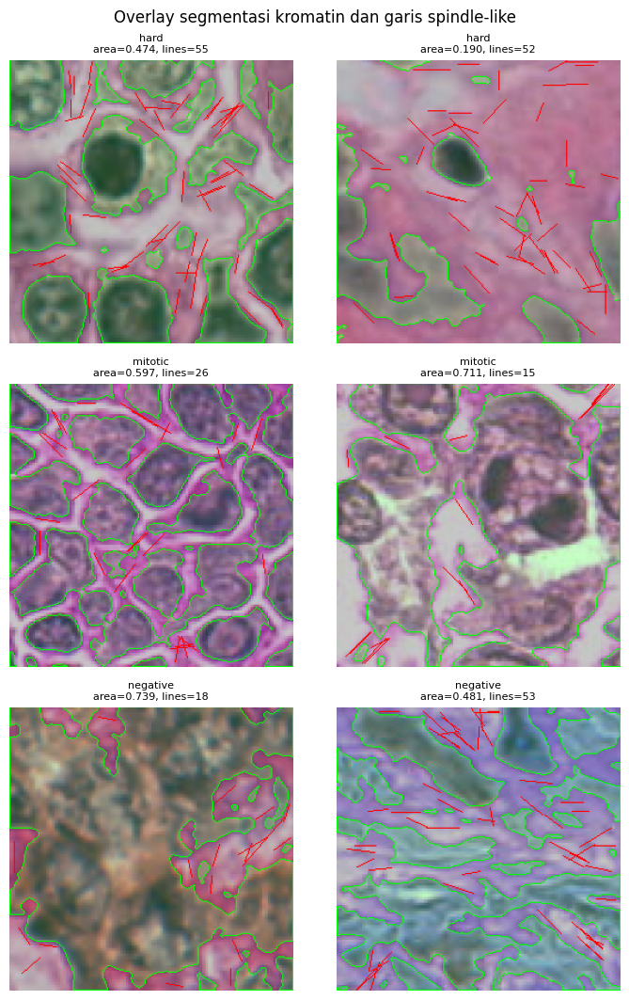

In [ ]:
def make_segmentation_overlay(image_path):
    features, artifacts = extract_spatial_features(image_path, return_artifacts=True)
    bgr = artifacts["bgr"].copy()

    mask_layer = np.zeros_like(bgr)
    mask_layer[:, :, 1] = artifacts["chromatin_mask"]
    overlay = cv2.addWeighted(bgr, 0.78, mask_layer, 0.22, 0)

    cv2.drawContours(overlay, artifacts["contours"], -1, (0, 255, 0), 1)
    for line in artifacts["lines"]:
        cv2.line(overlay, (line["x1"], line["y1"]), (line["x2"], line["y2"]), (0, 0, 255), 1)

    return cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB), features


def show_opencv_overlay_gallery(df, group_col="source_label", n_per_group=2):
    groups = sorted(df[group_col].dropna().astype(str).unique().tolist())
    if len(groups) == 0:
        return

    fig, axes = plt.subplots(len(groups), n_per_group, figsize=(n_per_group * 3.6, len(groups) * 3.6), squeeze=False)
    for row_idx, group in enumerate(groups):
        group_df = df[df[group_col].astype(str) == group]
        sample_df = group_df.sample(n=min(n_per_group, len(group_df)), random_state=RANDOM_STATE)
        for col_idx in range(n_per_group):
            ax = axes[row_idx, col_idx]
            ax.axis("off")
            if col_idx >= len(sample_df):
                continue
            item = sample_df.iloc[col_idx]
            overlay_rgb, feats = make_segmentation_overlay(item["image_path"])
            ax.imshow(overlay_rgb)
            ax.set_title(
                f"{group}\narea={feats['chromatin_area_ratio']:.3f}, lines={feats['spindle_line_count']}",
                fontsize=8,
            )
        axes[row_idx, 0].set_ylabel(group, fontsize=10)

    plt.suptitle("Overlay segmentasi kromatin dan garis spindle-like")
    plt.tight_layout()
    plt.show()


show_opencv_overlay_gallery(df_images, group_col="source_label", n_per_group=2)


## 15. Ekstraksi fitur untuk seluruh dataset

Sel ini memproses semua citra yang terindeks.
Hasil fitur disimpan ke cache agar run berikutnya lebih cepat.

In [ ]:
FEATURES_CACHE = OUTPUT_DIR / "opencv_spatial_features_preprocessed.csv"
REBUILD_FEATURES = False

if FEATURES_CACHE.exists() and not REBUILD_FEATURES:
    features_df = pd.read_csv(FEATURES_CACHE)
    print(f"Fitur dibaca dari cache: {FEATURES_CACHE}")
else:
    feature_rows = []
    failed_rows = []

    for i, row in df_images.iterrows():
        if (i + 1) % 250 == 0:
            print(f"Memproses {i + 1}/{len(df_images)} gambar ...")
        try:
            feats = extract_spatial_features(row["image_path"], return_artifacts=False)
            record = row.to_dict()
            record.update(feats)
            feature_rows.append(record)
        except Exception as exc:
            failed_rows.append({"image_path": row["image_path"], "error": str(exc)})

    features_df = pd.DataFrame(feature_rows)
    features_df.to_csv(FEATURES_CACHE, index=False)

    if failed_rows:
        failed_df = pd.DataFrame(failed_rows)
        failed_df.to_csv(OUTPUT_DIR / "failed_images.csv", index=False)
        print("Jumlah gambar gagal:", len(failed_df))

print("Shape features_df:", features_df.shape)
display(features_df.head())


Memproses 250/26119 gambar ...
Memproses 500/26119 gambar ...
Memproses 750/26119 gambar ...
Memproses 1000/26119 gambar ...
Memproses 1250/26119 gambar ...
Memproses 1500/26119 gambar ...
Memproses 1750/26119 gambar ...
Memproses 2000/26119 gambar ...
Memproses 2250/26119 gambar ...
Memproses 2500/26119 gambar ...
Memproses 2750/26119 gambar ...
Memproses 3000/26119 gambar ...
Memproses 3250/26119 gambar ...
Memproses 3500/26119 gambar ...
Memproses 3750/26119 gambar ...
Memproses 4000/26119 gambar ...
Memproses 4250/26119 gambar ...
Memproses 4500/26119 gambar ...
Memproses 4750/26119 gambar ...
Memproses 5000/26119 gambar ...
Memproses 5250/26119 gambar ...
Memproses 5500/26119 gambar ...
Memproses 5750/26119 gambar ...
Memproses 6000/26119 gambar ...
Memproses 6250/26119 gambar ...
Memproses 6500/26119 gambar ...
Memproses 6750/26119 gambar ...
Memproses 7000/26119 gambar ...
Memproses 7250/26119 gambar ...
Memproses 7500/26119 gambar ...
Memproses 7750/26119 gambar ...
Memproses 8

,image_path,file_name,source_label,parent_folder,extension,file_size_bytes,chromatin_area_ratio,edge_density,candidate_line_edge_density,gray_mean,...,cluster_separation_norm,cluster_balance,cluster_compactness_norm,spindle_line_count,spindle_total_length_norm,spindle_mean_length_norm,spindle_angle_coherence,spindle_dominant_angle_rad,axis_line_alignment,axis_line_perpendicularity
0,/root/.cache/kagglehub/datasets/hasan1101/mito...,0.png,negative,Negatives-100,.png,14440,0.240799,0.099136,0.054489,186.883240,...,0.319860,0.752336,0.162681,47,3.285843,0.069912,0.478007,-0.079078,0.990616,0.136678
1,/root/.cache/kagglehub/datasets/hasan1101/mito...,1.png,negative,Negatives-100,.png,18541,0.427933,0.096176,0.026199,177.869080,...,0.350554,0.766784,0.183390,9,0.520603,0.057845,0.314577,0.836154,0.999980,0.006274
2,/root/.cache/kagglehub/datasets/hasan1101/mito...,10.png,negative,Negatives-100,.png,20279,0.456512,0.135910,0.046844,170.752182,...,0.373902,0.802885,0.207855,34,2.435485,0.071632,0.764937,0.659019,0.969496,0.245108
3,/root/.cache/kagglehub/datasets/hasan1101/mito...,100.png,negative,Negatives-100,.png,21698,0.393311,0.184967,0.084518,160.637238,...,0.389087,0.854141,0.197393,99,6.422279,0.064872,0.482483,-0.714287,0.013036,0.999915
4,/root/.cache/kagglehub/datasets/hasan1101/mito...,1000.png,negative,Negatives-100,.png,21806,0.451324,0.162308,0.065750,159.566376,...,0.373166,0.932990,0.183323,57,3.609088,0.063317,0.364863,1.009016,0.668940,0.743316


## 16. EDA fitur OpenCV

Bagian ini memeriksa kualitas fitur numerik yang dihasilkan dari segmentasi kromatin, geometri spasial, clustering dua kutub, dan garis `spindle-like`.
EDA fitur membantu melihat apakah fitur cukup informatif sebelum model klasifikasi dilatih.

In [ ]:
metadata_cols_base = {"image_path", "file_name", "source_label", "parent_folder", "extension", "phase"}
numeric_feature_cols = [
    c for c in features_df.columns
    if c not in metadata_cols_base and pd.api.types.is_numeric_dtype(features_df[c])
]

eda_feature_cols = [
    c for c in [
        "chromatin_area_ratio",
        "object_count",
        "mean_object_area_norm",
        "mean_circularity",
        "edge_density",
        "candidate_line_edge_density",
        "pca_axis_ratio",
        "pca_major_span_norm",
        "pca_minor_span_norm",
        "band_score",
        "cluster_separation_norm",
        "cluster_balance",
        "cluster_compactness_norm",
        "spindle_line_count",
        "spindle_total_length_norm",
        "spindle_angle_coherence",
        "axis_line_alignment",
        "axis_line_perpendicularity",
    ] if c in numeric_feature_cols
]

missing_feature_df = (
    features_df[numeric_feature_cols]
    .isna()
    .mean()
    .mul(100)
    .sort_values(ascending=False)
    .rename("missing_percent")
    .reset_index()
    .rename(columns={"index": "feature"})
)

print("Jumlah fitur numerik:", len(numeric_feature_cols))
display(missing_feature_df.head(20))

describe_cols = ["mean", "std", "min", "25%", "50%", "75%", "max"]
describe_df = features_df[numeric_feature_cols].describe().T[describe_cols].round(4)
display(describe_df.head(30))

if "source_label" in features_df.columns and len(eda_feature_cols) > 0:
    source_feature_summary = features_df.groupby("source_label")[eda_feature_cols].agg(["mean", "median", "std"]).round(4)
    display(source_feature_summary)


Jumlah fitur numerik: 38


,feature,missing_percent
0,file_size_bytes,0.0
1,chromatin_area_ratio,0.0
2,edge_density,0.0
3,candidate_line_edge_density,0.0
4,gray_mean,0.0
5,gray_std,0.0
6,clahe_mean,0.0
7,clahe_std,0.0
8,background_corrected_mean,0.0
9,background_corrected_std,0.0


,mean,std,min,25%,50%,75%,max
file_size_bytes,22358.5238,3120.5916,105.0000,20959.0000,22773.0000,24544.5000,27656.0000
chromatin_area_ratio,0.5067,0.1350,0.0000,0.4456,0.5330,0.6041,0.8196
edge_density,0.1610,0.0428,0.0012,0.1319,0.1581,0.2014,0.3524
candidate_line_edge_density,0.0539,0.0270,0.0000,0.0385,0.0495,0.0631,0.2344
gray_mean,142.2255,27.9597,62.1232,122.1515,139.8845,161.1054,254.2590
gray_std,40.9747,9.4357,0.5621,34.9445,41.0955,47.0673,89.6846
clahe_mean,139.8442,19.7841,87.2709,126.4778,136.4798,150.1881,254.3165
clahe_std,53.2219,7.6666,1.7766,49.2209,54.5053,58.3266,80.4753
background_corrected_mean,23.9304,4.0909,2.4341,21.8294,24.2496,26.5414,35.4585
background_corrected_std,35.7409,4.7162,8.6280,33.0176,36.0716,38.9226,50.6780


chromatin_area_ratio                 object_count         \
                             mean  median     std         mean median   
source_label                                                            
hard                       0.5187  0.5510  0.1322      18.0822   15.0   
mitotic                    0.5119  0.5356  0.1260      18.6576   17.0   
negative                   0.4842  0.5092  0.1478      13.1311   11.0   

                      mean_object_area_norm                 mean_circularity  \
                  std                  mean  median     std             mean   
source_label                                                                   
hard          11.5207                0.0467  0.0335  0.0537           0.4993   
mitotic       10.5382                0.0421  0.0299  0.0498           0.5073   
negative      11.1455                0.0743  0.0440  0.0951           0.4908   

              ... spindle_total_length_norm spindle_angle_coherence          \
              ...                       std                    mean  median   
source_label  ...                                                             
hard          ...                    3.3821                  0.2577  0.2298   
mitotic       ...                    3.1305                  0.2413  0.2196   
negative      ...                    1.8407                  0.3950  0.3517   

                     axis_line_alignment                  \
                 std                mean  median     std   
source_label                                               
hard          0.1577              0.5715  0.6041  0.3206   
mitotic       0.1428              0.5703  0.5928  0.3187   
negative      0.2457              0.6176  0.6831  0.3270   

             axis_line_perpendicularity                  
                                   mean  median     std  
source_label                                             
hard                             0.6931  0.7969  0.3003  
mitotic                          0.6953  0.8053  0.2997  
negative                         0.6341  0.7303  0.3310  

[3 rows x 54 columns]

## 17. Visualisasi distribusi fitur dan korelasi

Plot ini memperlihatkan fitur yang membedakan citra berdasarkan label folder sumber.
Pola yang jelas pada grafik dapat menjadi dasar argumen bahwa fitur OpenCV menangkap struktur spasial yang relevan.

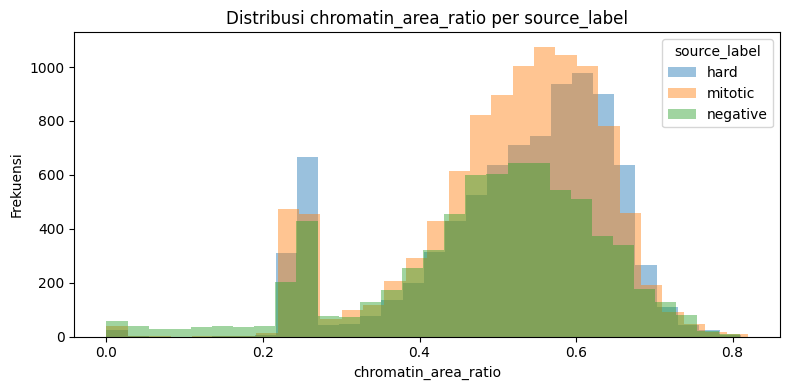

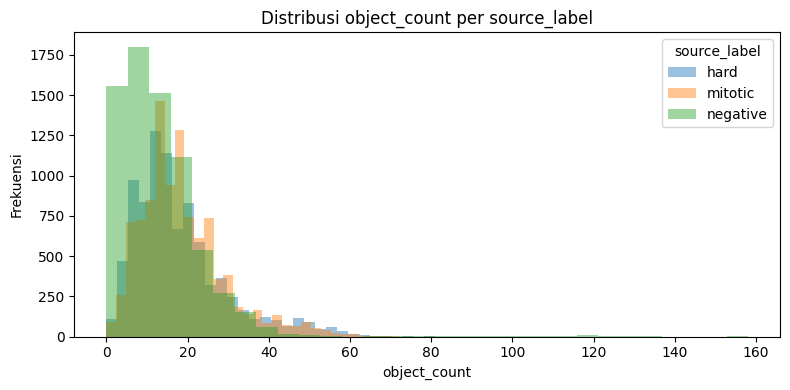

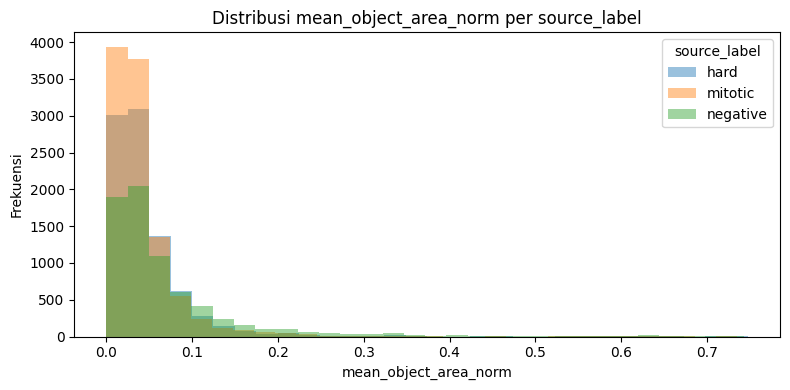

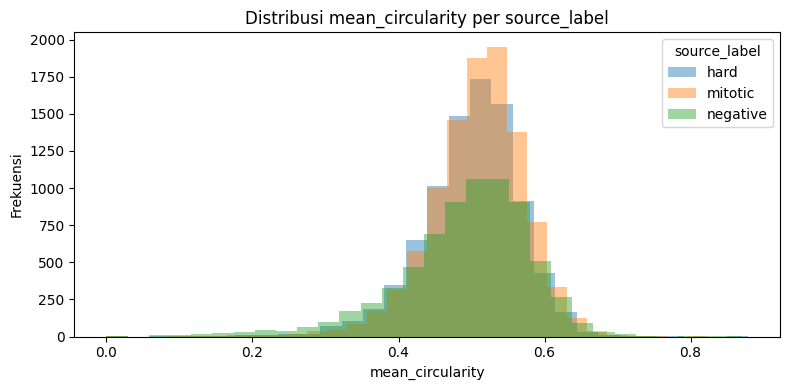

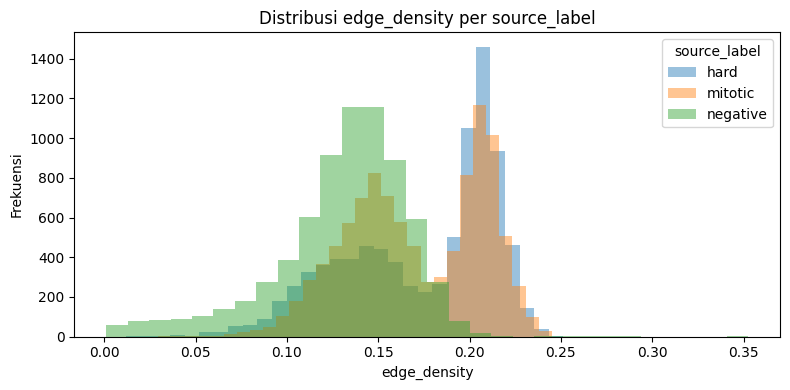

...

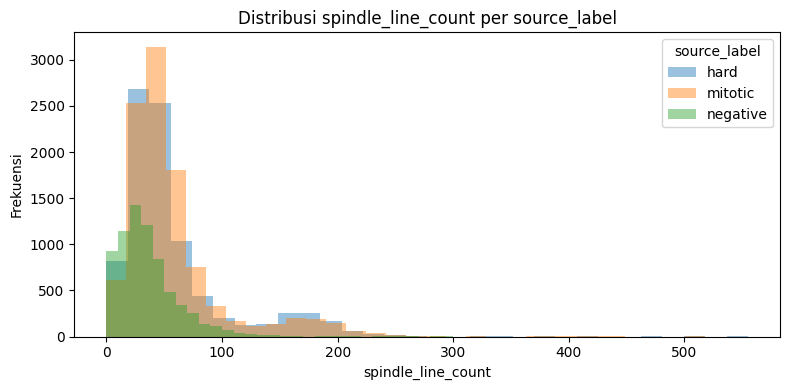

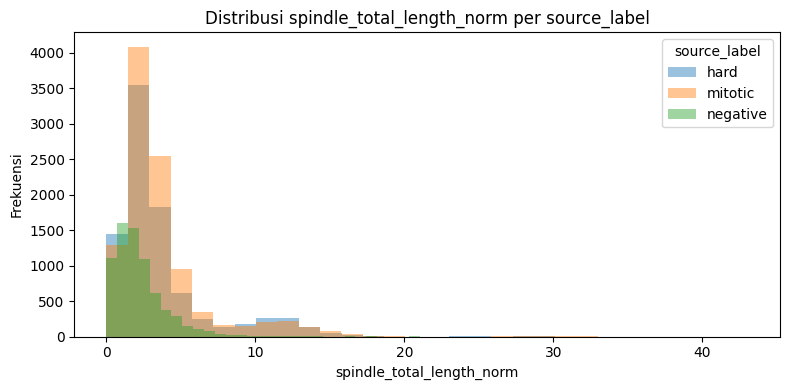

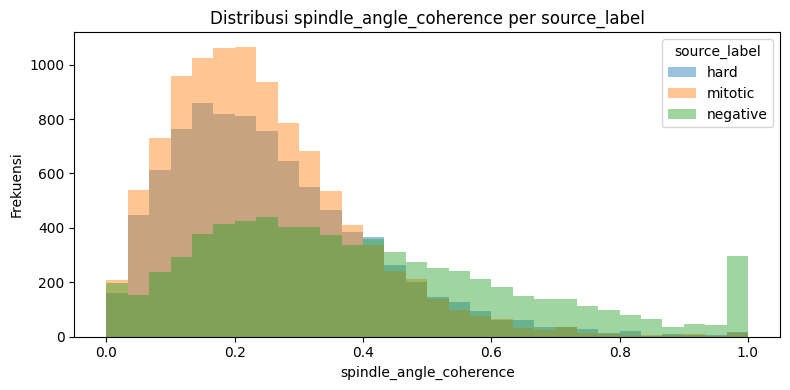

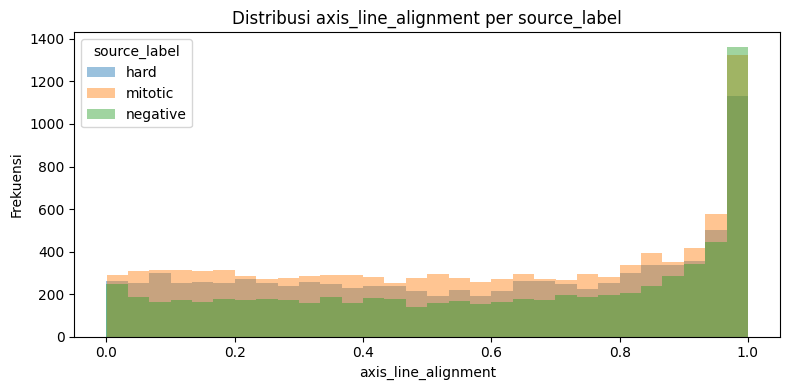

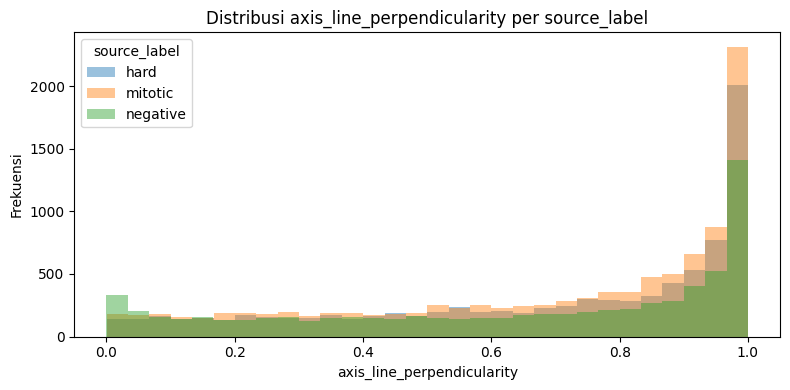

<Figure size 900x400 with 0 Axes>

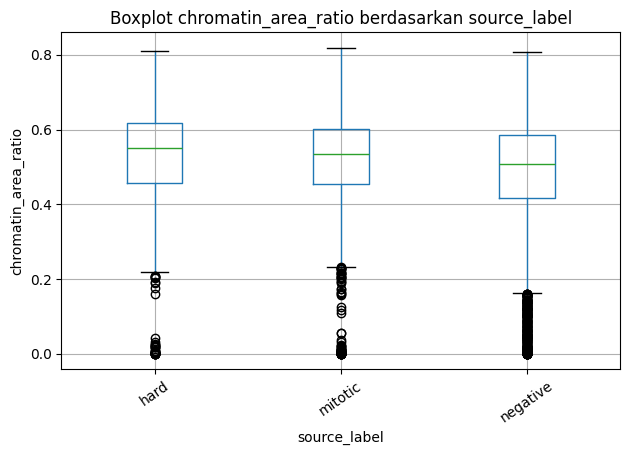

<Figure size 900x400 with 0 Axes>

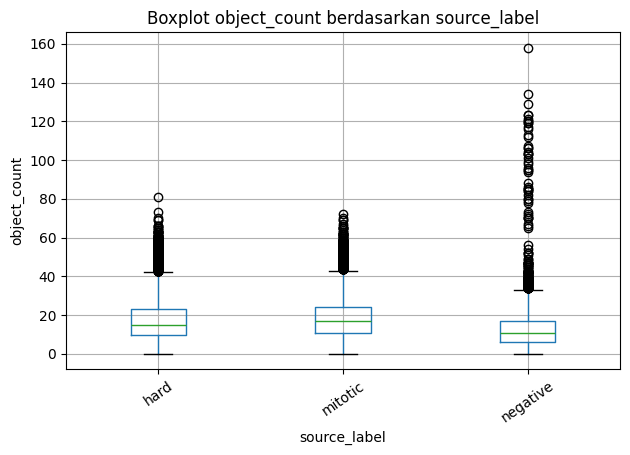

<Figure size 900x400 with 0 Axes>

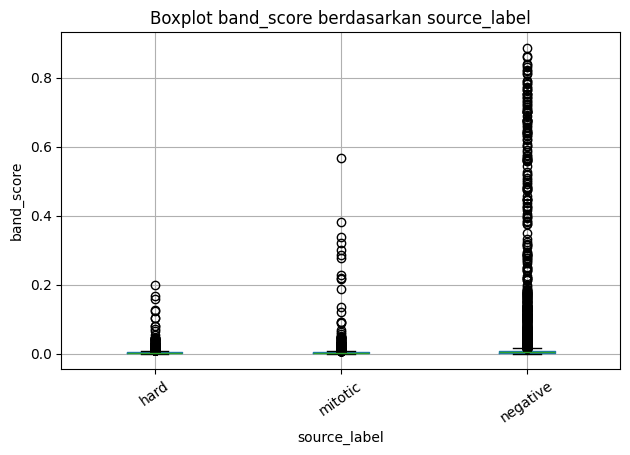

<Figure size 900x400 with 0 Axes>

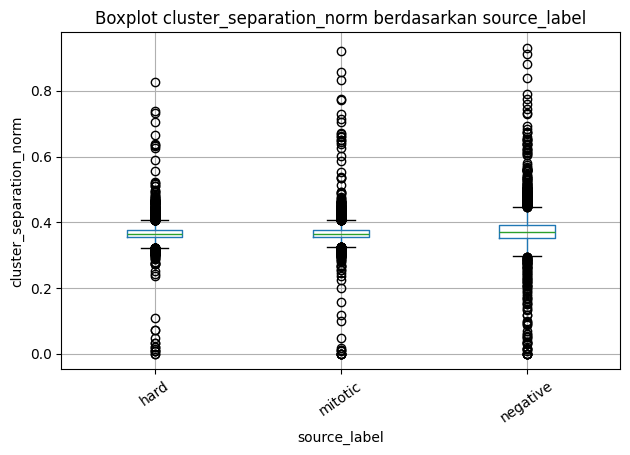

<Figure size 900x400 with 0 Axes>

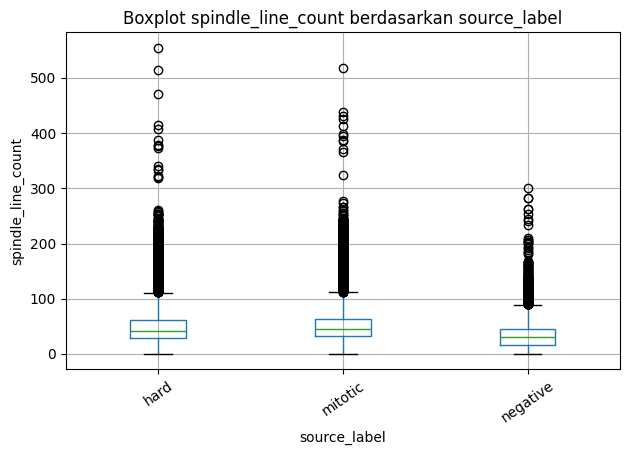

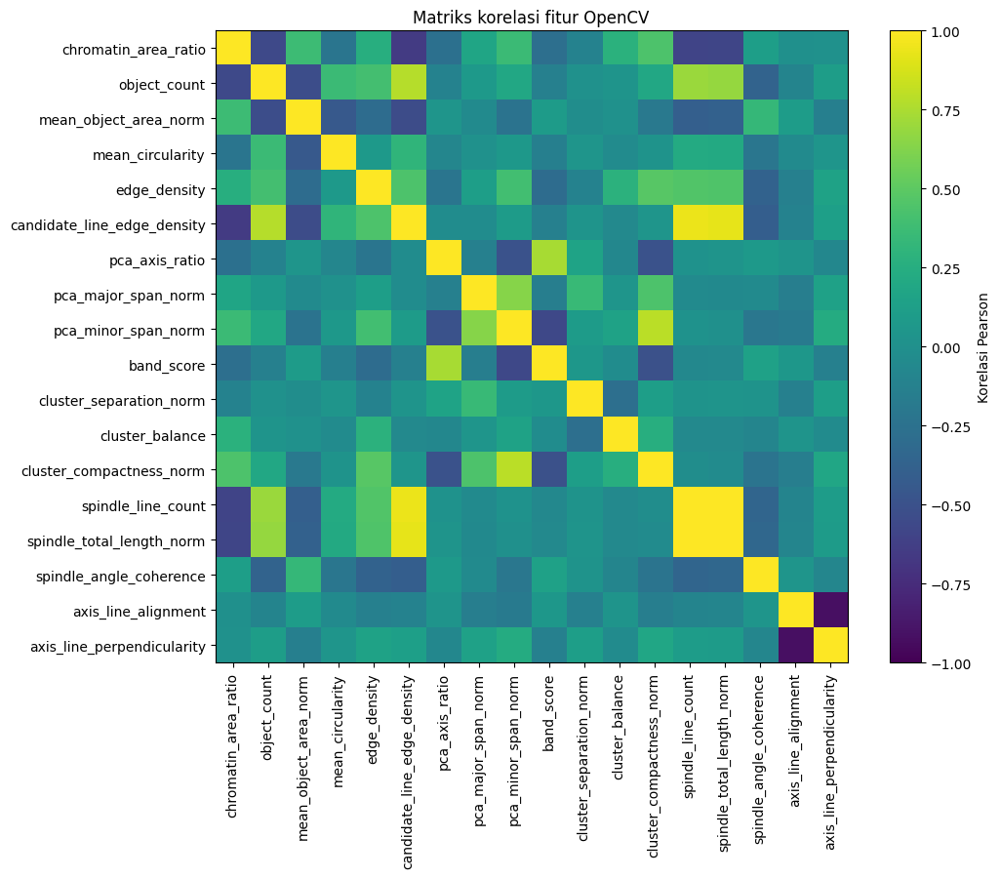

In [ ]:
for feature in eda_feature_cols:
    plt.figure(figsize=(8, 4))
    plotted = False
    for label, group in features_df.groupby("source_label"):
        values = pd.to_numeric(group[feature], errors="coerce").dropna()
        if len(values) == 0:
            continue
        plt.hist(values, bins=30, alpha=0.45, label=label)
        plotted = True
    if plotted:
        plt.title(f"Distribusi {feature} per source_label")
        plt.xlabel(feature)
        plt.ylabel("Frekuensi")
        plt.legend(title="source_label")
        plt.tight_layout()
        plt.show()
    else:
        plt.close()

for feature in ["chromatin_area_ratio", "object_count", "band_score", "cluster_separation_norm", "spindle_line_count"]:
    if feature in features_df.columns:
        plt.figure(figsize=(9, 4))
        features_df.boxplot(column=feature, by="source_label", rot=35)
        plt.title(f"Boxplot {feature} berdasarkan source_label")
        plt.suptitle("")
        plt.xlabel("source_label")
        plt.ylabel(feature)
        plt.tight_layout()
        plt.show()

if len(eda_feature_cols) >= 2:
    corr = features_df[eda_feature_cols].corr()
    plt.figure(figsize=(11, 9))
    plt.imshow(corr, vmin=-1, vmax=1)
    plt.colorbar(label="Korelasi Pearson")
    plt.xticks(range(len(eda_feature_cols)), eda_feature_cols, rotation=90)
    plt.yticks(range(len(eda_feature_cols)), eda_feature_cols)
    plt.title("Matriks korelasi fitur OpenCV")
    plt.tight_layout()
    plt.show()


## 18. Proyeksi PCA fitur OpenCV

PCA dipakai hanya untuk visualisasi dua dimensi.
Plot ini tidak mengganti model utama.
Tujuannya adalah melihat apakah fitur OpenCV membentuk kelompok citra yang terpisah secara visual.

Explained variance PC1: 0.226
Explained variance PC2: 0.145


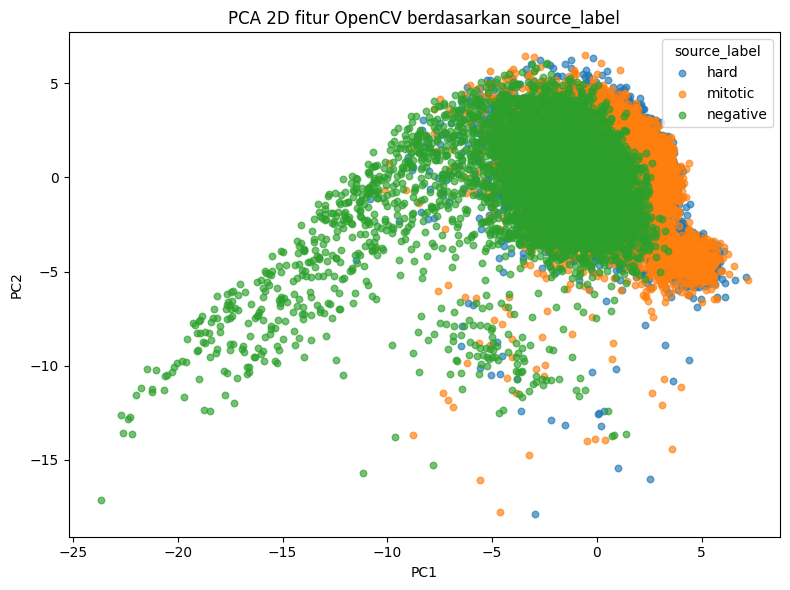

In [ ]:
pca_feature_cols = numeric_feature_cols.copy()

if len(pca_feature_cols) >= 2 and len(features_df) >= 2:
    X_pca_raw = features_df[pca_feature_cols].replace([np.inf, -np.inf], np.nan)
    X_pca_raw = X_pca_raw.fillna(X_pca_raw.median(numeric_only=True))

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_pca_raw)

    pca_2d = PCA(n_components=2, random_state=RANDOM_STATE)
    embedding = pca_2d.fit_transform(X_scaled)

    pca_vis_df = features_df[["image_path", "file_name", "source_label"]].copy()
    pca_vis_df["pca_1"] = embedding[:, 0]
    pca_vis_df["pca_2"] = embedding[:, 1]

    explained = pca_2d.explained_variance_ratio_
    print(f"Explained variance PC1: {explained[0]:.3f}")
    print(f"Explained variance PC2: {explained[1]:.3f}")

    plt.figure(figsize=(8, 6))
    for label, group in pca_vis_df.groupby("source_label"):
        plt.scatter(group["pca_1"], group["pca_2"], alpha=0.65, s=22, label=label)
    plt.title("PCA 2D fitur OpenCV berdasarkan source_label")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend(title="source_label")
    plt.tight_layout()
    plt.show()
else:
    print("PCA dilewati karena jumlah data atau fitur terlalu sedikit.")


## 19. Template label manual

Jika ingin membuat label manual, jalankan sel ini lalu isi file template.
File minimal perlu kolom `image_path`, `file_name`, `source_label`, dan `phase`.
Isi `phase` dengan salah satu label yang disepakati kelompok.

In [ ]:
manual_template_path = OUTPUT_DIR / "manual_phase_labels_template.csv"
manual_template = features_df[["image_path", "file_name", "source_label"]].copy()
manual_template["phase"] = ""
manual_template.to_csv(manual_template_path, index=False)
print("Template label manual disimpan di:", manual_template_path.resolve())
manual_template.head()


Template label manual disimpan di: /content/outputs_meiosis_opencv/manual_phase_labels_template.csv


,image_path,file_name,source_label,phase
0,/root/.cache/kagglehub/datasets/hasan1101/mito...,0.png,negative,
1,/root/.cache/kagglehub/datasets/hasan1101/mito...,1.png,negative,
2,/root/.cache/kagglehub/datasets/hasan1101/mito...,10.png,negative,
3,/root/.cache/kagglehub/datasets/hasan1101/mito...,100.png,negative,
4,/root/.cache/kagglehub/datasets/hasan1101/mito...,1000.png,negative,


## 20. Membuat target klasifikasi

Jika `manual_phase_labels.csv` tersedia, notebook memakai label manual.
Jika belum tersedia, notebook membuat pseudo-label berdasarkan aturan fitur OpenCV.

In [ ]:
def create_pseudo_phase_labels(df):
    q = {
        "area_low": df["chromatin_area_ratio"].quantile(0.20),
        "sep_high": df["cluster_separation_norm"].quantile(0.68),
        "sep_very_high": df["cluster_separation_norm"].quantile(0.82),
        "band_high": df["band_score"].quantile(0.68),
        "axis_high": df["pca_axis_ratio"].quantile(0.65),
        "compact_low": df["cluster_compactness_norm"].quantile(0.45),
        "object_median": df["object_count"].median(),
    }

    labels = []
    for _, row in df.iterrows():
        source = str(row.get("source_label", "unknown")).lower()
        area = row["chromatin_area_ratio"]
        sep = row["cluster_separation_norm"]
        balance = row["cluster_balance"]
        compact = row["cluster_compactness_norm"]
        band = row["band_score"]
        axis_ratio = row["pca_axis_ratio"]
        obj_count = row["object_count"]

        if source == "negative" and (area <= q["area_low"] or obj_count <= 1):
            labels.append("non_dividing_like")
        elif sep >= q["sep_very_high"] and balance >= 0.25 and compact <= q["compact_low"]:
            labels.append("telophase_like")
        elif sep >= q["sep_high"] and balance >= 0.20:
            labels.append("anaphase_like")
        elif band >= q["band_high"] or (axis_ratio >= q["axis_high"] and sep < q["sep_high"]):
            labels.append("metaphase_like")
        elif source == "negative" and area <= df["chromatin_area_ratio"].quantile(0.35):
            labels.append("non_dividing_like")
        else:
            labels.append("prophase_like")

    return pd.Series(labels, index=df.index, name="phase")


def apply_manual_labels(df, csv_path):
    manual_df = pd.read_csv(csv_path)
    required = {"phase"}
    if not required.issubset(set(manual_df.columns)):
        raise ValueError("manual_phase_labels.csv wajib punya kolom 'phase'.")

    if "image_path" in manual_df.columns:
        merged = df.merge(manual_df[["image_path", "phase"]], on="image_path", how="left")
    elif "file_name" in manual_df.columns:
        merged = df.merge(manual_df[["file_name", "phase"]], on="file_name", how="left")
    else:
        raise ValueError("manual_phase_labels.csv harus punya kolom 'image_path' atau 'file_name'.")

    merged = merged.dropna(subset=["phase"]).copy()
    merged["phase"] = merged["phase"].astype(str).str.strip()
    merged = merged[merged["phase"] != ""]
    return merged


if MANUAL_LABEL_CSV.exists():
    model_df = apply_manual_labels(features_df, MANUAL_LABEL_CSV)
    label_mode = "manual"
else:
    model_df = features_df.copy()
    model_df["phase"] = create_pseudo_phase_labels(model_df)
    label_mode = "pseudo"

print("Mode label:", label_mode)
print("Jumlah data berlabel:", len(model_df))
display(model_df["phase"].value_counts().rename_axis("phase").reset_index(name="count"))

if label_mode == "pseudo":
    print("PERINGATAN: Evaluasi dengan pseudo-label hanya mengukur konsistensi aturan, bukan kebenaran fase biologis.")


Mode label: pseudo
Jumlah data berlabel: 26119


,phase,count
0,prophase_like,12630
1,anaphase_like,5310
2,metaphase_like,3924
3,non_dividing_like,2213
4,telophase_like,2042


PERINGATAN: Evaluasi dengan pseudo-label hanya mengukur konsistensi aturan, bukan kebenaran fase biologis.


## 21. EDA target klasifikasi

Bagian ini melihat hubungan antara label target dan label folder sumber.
Jika memakai pseudo-label, gunakan hasil ini sebagai audit aturan, bukan sebagai validasi biologis final.

,phase,count
0,prophase_like,12630
1,anaphase_like,5310
2,metaphase_like,3924
3,non_dividing_like,2213
4,telophase_like,2042


source_label,hard,mitotic,negative
phase,,,
anaphase_like,1691,2278,1341
metaphase_like,1300,1445,1179
non_dividing_like,0,0,2213
prophase_like,5138,5911,1581
telophase_like,647,622,773


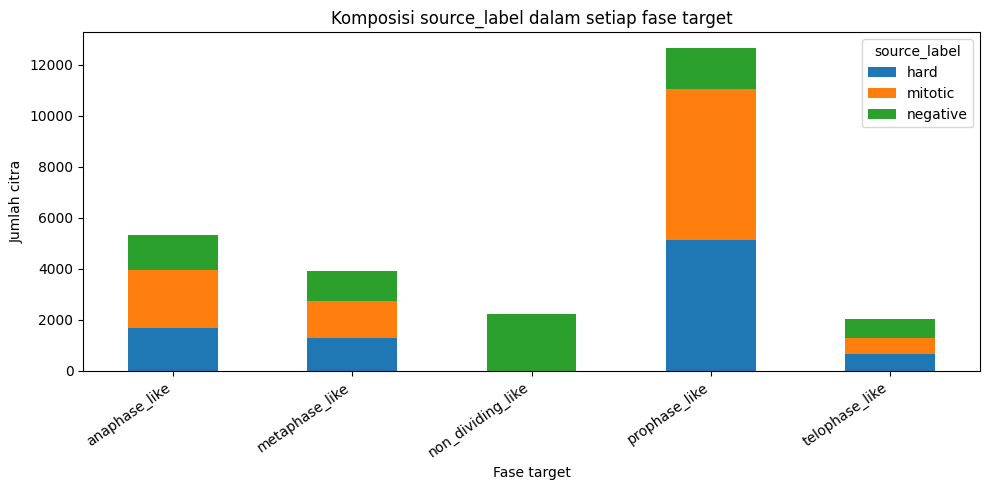

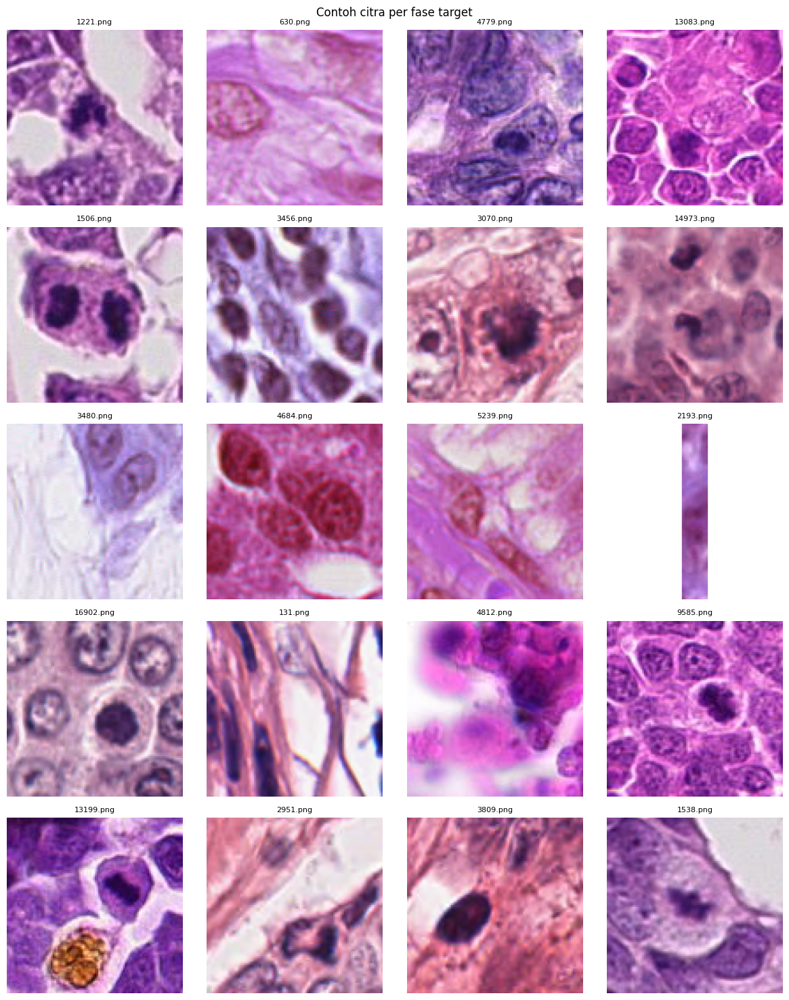

In [ ]:
phase_counts_df = model_df["phase"].value_counts().rename_axis("phase").reset_index(name="count")
display(phase_counts_df)

if "source_label" in model_df.columns:
    phase_source_table = pd.crosstab(model_df["phase"], model_df["source_label"])
    display(phase_source_table)

    plt.figure(figsize=(10, 5))
    phase_source_table.plot(kind="bar", stacked=True, ax=plt.gca())
    plt.title("Komposisi source_label dalam setiap fase target")
    plt.xlabel("Fase target")
    plt.ylabel("Jumlah citra")
    plt.xticks(rotation=35, ha="right")
    plt.legend(title="source_label")
    plt.tight_layout()
    plt.show()

show_grouped_image_grid(model_df, group_col="phase", n_per_group=MAX_VISUAL_PER_GROUP, title="Contoh citra per fase target")


## 22. Visualisasi hubungan fitur utama dengan fase target

Scatter plot ini membantu membaca aturan biologis yang diproksikan oleh fitur.
Misalnya, `band_score` berkaitan dengan pola mirip bidang ekuator, sedangkan `cluster_separation_norm` berkaitan dengan pemisahan dua kelompok kromosom.

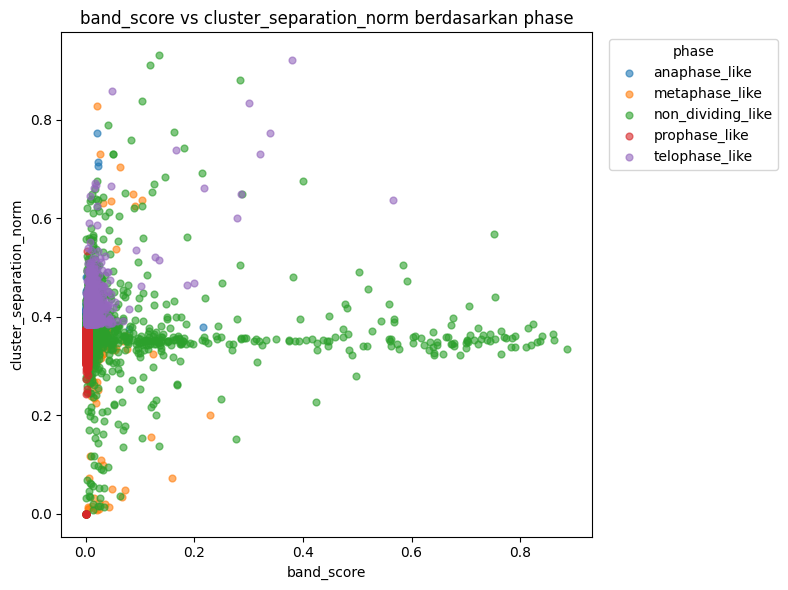

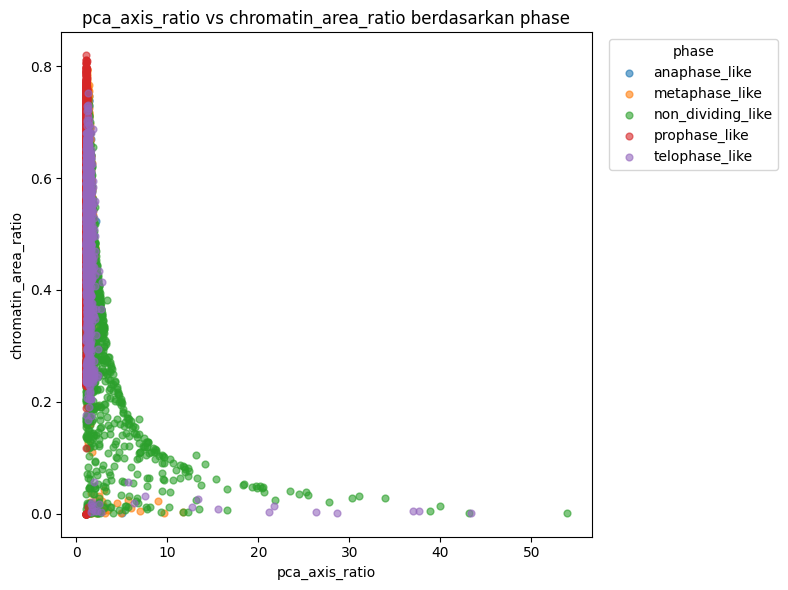

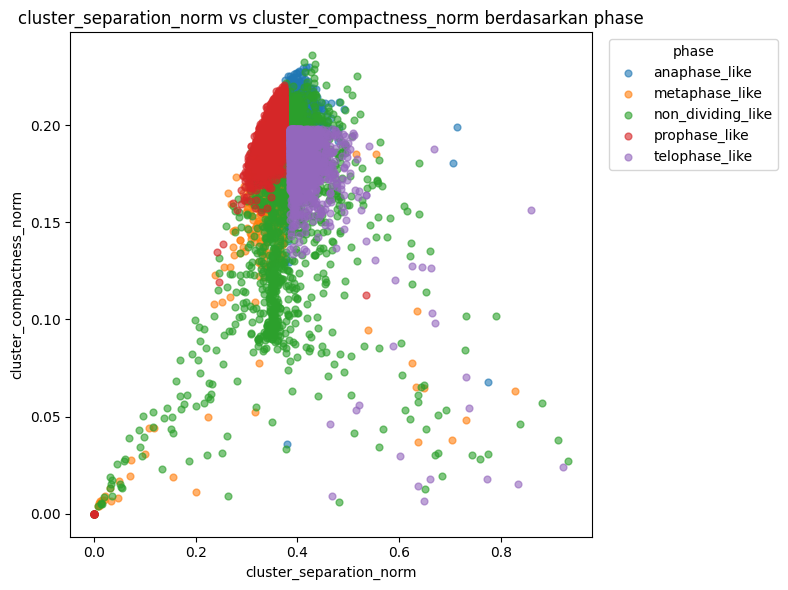

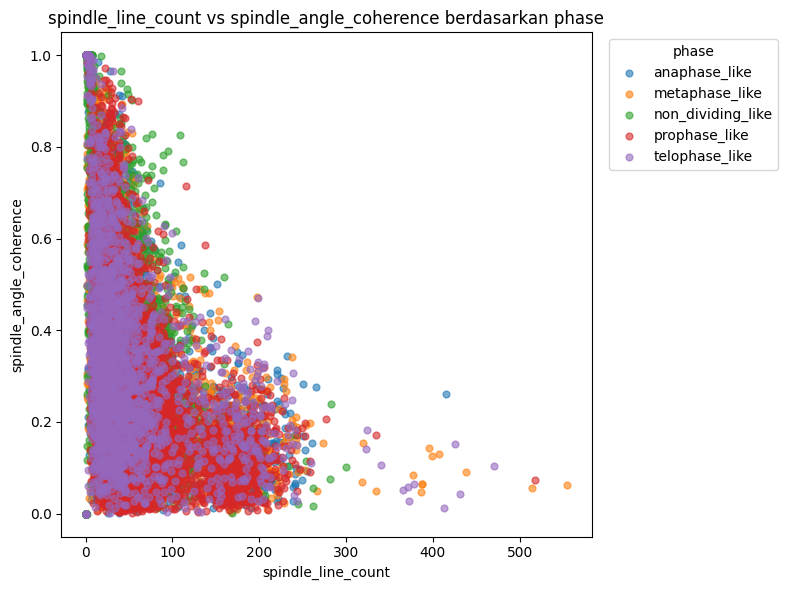

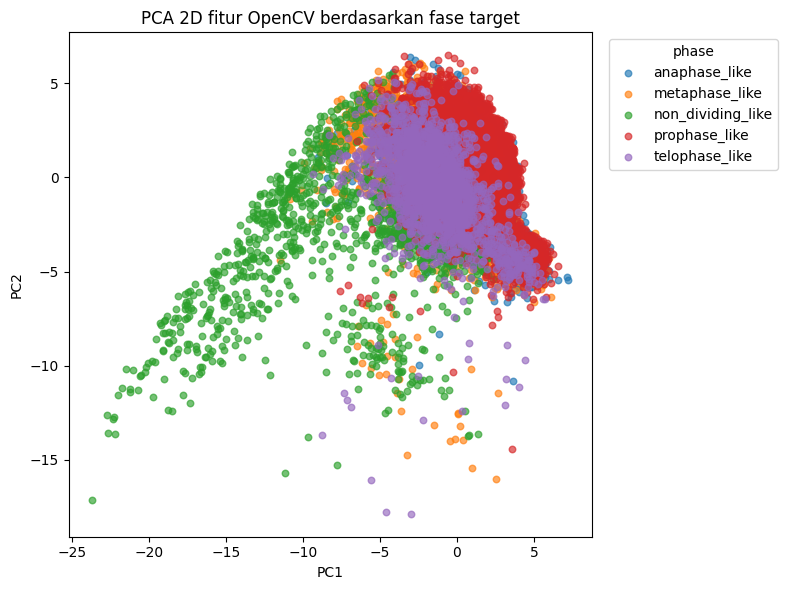

In [ ]:
def scatter_features_by_label(df, x_col, y_col, label_col="phase"):
    if x_col not in df.columns or y_col not in df.columns:
        print(f"Kolom {x_col} atau {y_col} tidak ditemukan.")
        return

    plt.figure(figsize=(8, 6))
    for label, group in df.groupby(label_col):
        plt.scatter(group[x_col], group[y_col], alpha=0.6, s=24, label=label)
    plt.title(f"{x_col} vs {y_col} berdasarkan {label_col}")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.legend(title=label_col, bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


scatter_features_by_label(model_df, "band_score", "cluster_separation_norm", "phase")
scatter_features_by_label(model_df, "pca_axis_ratio", "chromatin_area_ratio", "phase")
scatter_features_by_label(model_df, "cluster_separation_norm", "cluster_compactness_norm", "phase")
scatter_features_by_label(model_df, "spindle_line_count", "spindle_angle_coherence", "phase")

if len(pca_feature_cols) >= 2 and len(model_df) >= 2:
    X_phase_pca = model_df[pca_feature_cols].replace([np.inf, -np.inf], np.nan)
    X_phase_pca = X_phase_pca.fillna(X_phase_pca.median(numeric_only=True))
    X_phase_scaled = StandardScaler().fit_transform(X_phase_pca)
    phase_pca = PCA(n_components=2, random_state=RANDOM_STATE)
    phase_embedding = phase_pca.fit_transform(X_phase_scaled)

    phase_pca_df = model_df[["image_path", "file_name", "phase"]].copy()
    phase_pca_df["pca_1"] = phase_embedding[:, 0]
    phase_pca_df["pca_2"] = phase_embedding[:, 1]

    plt.figure(figsize=(8, 6))
    for phase, group in phase_pca_df.groupby("phase"):
        plt.scatter(group["pca_1"], group["pca_2"], alpha=0.65, s=22, label=phase)
    plt.title("PCA 2D fitur OpenCV berdasarkan fase target")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend(title="phase", bbox_to_anchor=(1.02, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


## 23. Visualisasi distribusi fitur per fase

Bagian ini membantu menjelaskan hasil pada laporan.
Fokuskan analisis pada hubungan fitur dengan konsep biologis.

,chromatin_area_ratio,object_count,pca_axis_ratio,band_score,cluster_separation_norm,cluster_balance,cluster_compactness_norm,spindle_line_count,spindle_angle_coherence,axis_line_alignment,axis_line_perpendicularity
phase,,,,,,,,,,,
anaphase_like,0.5012,17.2347,1.1282,0.0045,0.3865,0.8042,0.2021,53.4985,0.2833,0.5169,0.7452
metaphase_like,0.5014,15.2090,1.2396,0.0080,0.3548,0.8277,0.1832,49.4664,0.3219,0.6440,0.6175
non_dividing_like,0.3195,18.0045,2.0370,0.0492,0.3768,0.7564,0.1677,48.0362,0.3940,0.6547,0.5761
prophase_like,0.5514,17.5029,1.0597,0.0021,0.3569,0.8655,0.2015,51.4871,0.2543,0.5935,0.6751
telophase_like,0.4575,15.1807,1.4226,0.0118,0.4102,0.7305,0.1838,51.5220,0.3354,0.5020,0.7478


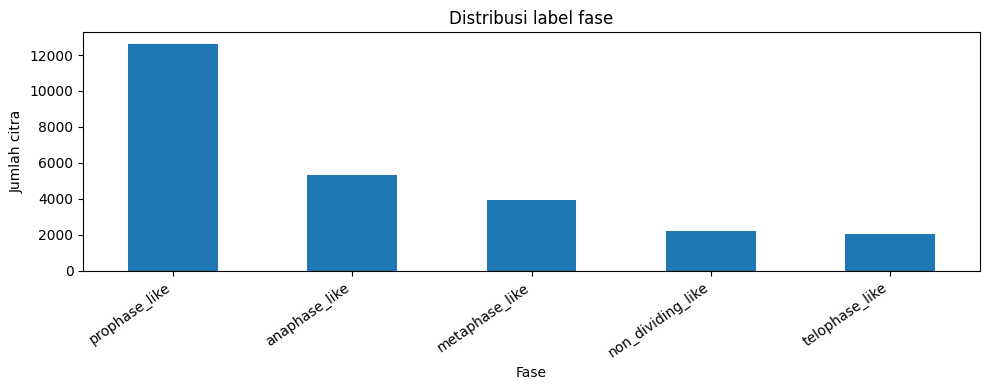

<Figure size 900x400 with 0 Axes>

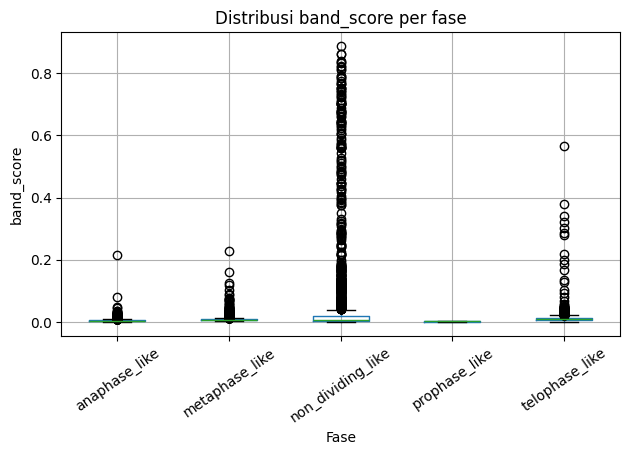

<Figure size 900x400 with 0 Axes>

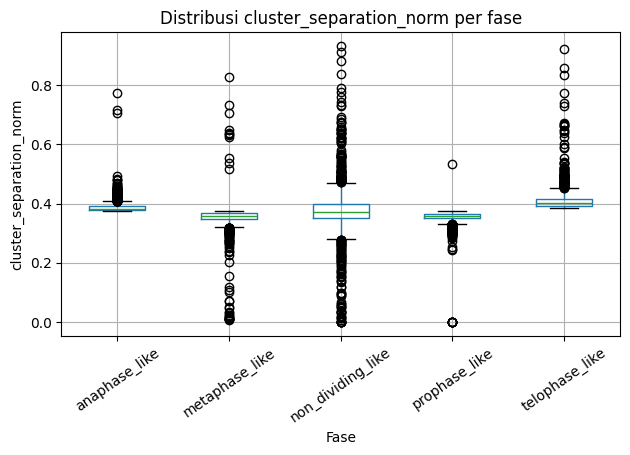

<Figure size 900x400 with 0 Axes>

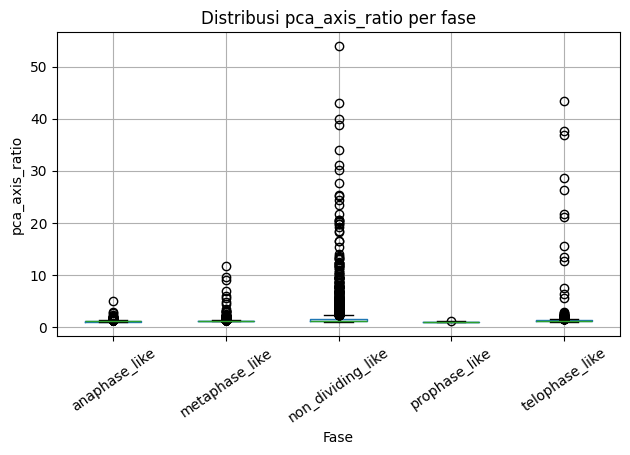

<Figure size 900x400 with 0 Axes>

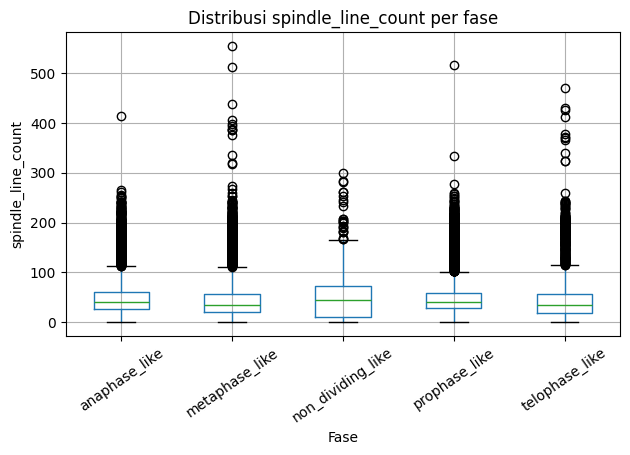

In [ ]:
important_features = [
    "chromatin_area_ratio",
    "object_count",
    "pca_axis_ratio",
    "band_score",
    "cluster_separation_norm",
    "cluster_balance",
    "cluster_compactness_norm",
    "spindle_line_count",
    "spindle_angle_coherence",
    "axis_line_alignment",
    "axis_line_perpendicularity",
]
important_features = [f for f in important_features if f in model_df.columns]

summary_by_phase = model_df.groupby("phase")[important_features].mean().round(4)
display(summary_by_phase)

plt.figure(figsize=(10, 4))
model_df["phase"].value_counts().plot(kind="bar")
plt.title("Distribusi label fase")
plt.xlabel("Fase")
plt.ylabel("Jumlah citra")
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.show()

for feature in ["band_score", "cluster_separation_norm", "pca_axis_ratio", "spindle_line_count"]:
    if feature in model_df.columns:
        plt.figure(figsize=(9, 4))
        model_df.boxplot(column=feature, by="phase", rot=35)
        plt.title(f"Distribusi {feature} per fase")
        plt.suptitle("")
        plt.xlabel("Fase")
        plt.ylabel(feature)
        plt.tight_layout()
        plt.show()


## 24. Pelatihan model klasifikasi

Model memakai fitur spasial OpenCV, bukan piksel mentah.
Model utama adalah Random Forest karena mudah dijelaskan melalui feature importance.

In [ ]:
metadata_cols = {
    "image_path", "file_name", "source_label", "parent_folder", "extension", "phase"
}
feature_cols = [c for c in model_df.columns if c not in metadata_cols and pd.api.types.is_numeric_dtype(model_df[c])]

train_df = model_df.dropna(subset=["phase"]).copy()
class_counts = train_df["phase"].value_counts()
valid_classes = class_counts[class_counts >= 2].index.tolist()
train_df = train_df[train_df["phase"].isin(valid_classes)].copy()

if train_df["phase"].nunique() < 2:
    raise ValueError("Butuh minimal dua kelas dengan minimal dua sampel per kelas untuk melatih model.")

X = train_df[feature_cols]
y = train_df["phase"]

n_classes = y.nunique()
min_class_count = y.value_counts().min()

if min_class_count >= 2 and len(train_df) >= 2 * n_classes:
    desired_test_count = max(n_classes, int(round(0.25 * len(train_df))))
    desired_test_count = min(desired_test_count, len(train_df) - n_classes)
    test_size = desired_test_count
    stratify_arg = y
else:
    test_size = 0.25
    stratify_arg = None

X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(
    X,
    y,
    train_df.index,
    test_size=test_size,
    random_state=RANDOM_STATE,
    stratify=stratify_arg,
)

model = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median")),
    ("classifier", RandomForestClassifier(
        n_estimators=350,
        random_state=RANDOM_STATE,
        class_weight="balanced_subsample",
        max_depth=None,
        min_samples_leaf=2,
        n_jobs=-1,
    )),
])

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

print("Jumlah fitur:", len(feature_cols))
print("Train size:", len(X_train))
print("Test size:", len(X_test))
print("Mode label:", label_mode)
print("\nClassification report:")
print(classification_report(y_test, y_pred, zero_division=0))


Jumlah fitur: 38
Train size: 19589
Test size: 6530
Mode label: pseudo

Classification report:
                   precision    recall  f1-score   support

    anaphase_like       0.97      0.98      0.97      1328
   metaphase_like       0.96      0.97      0.97       981
non_dividing_like       0.81      0.69      0.75       553
    prophase_like       0.98      0.99      0.98      3158
   telophase_like       0.94      0.92      0.93       510

         accuracy                           0.96      6530
        macro avg       0.93      0.91      0.92      6530
     weighted avg       0.96      0.96      0.96      6530



## 25. Ringkasan metrik klasifikasi

Bagian ini mengubah classification report menjadi tabel dan grafik.
Metrik ini memudahkan pembahasan hasil kuantitatif pada laporan.

,precision,recall,f1-score,support
anaphase_like,0.9660,0.9827,0.9742,1328.0000
metaphase_like,0.9646,0.9725,0.9685,981.0000
non_dividing_like,0.8097,0.6926,0.7466,553.0000
prophase_like,0.9755,0.9940,0.9846,3158.0000
telophase_like,0.9399,0.9196,0.9296,510.0000
accuracy,0.9571,0.9571,0.9571,0.9571
macro avg,0.9311,0.9123,0.9207,6530.0000
weighted avg,0.9551,0.9571,0.9556,6530.0000


,metric,value
0,accuracy,0.9571
1,macro_f1,0.9207
2,weighted_f1,0.9556


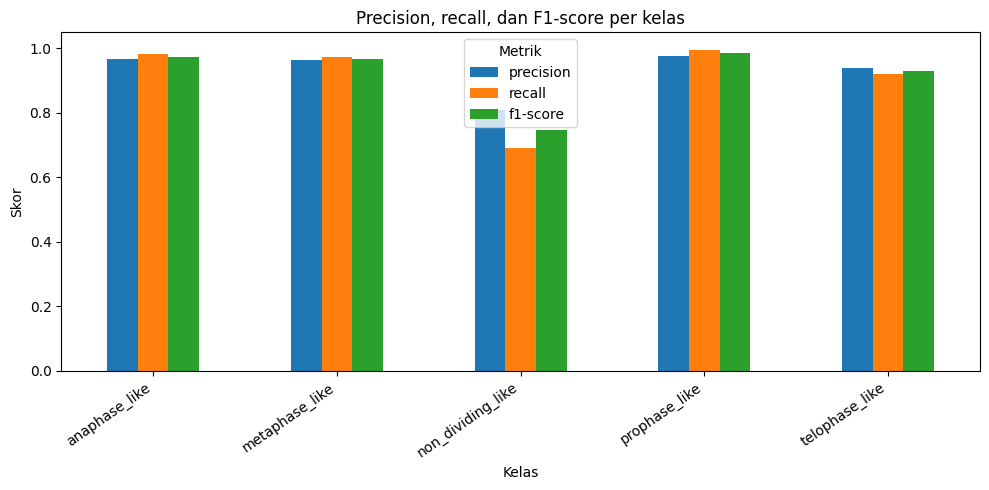

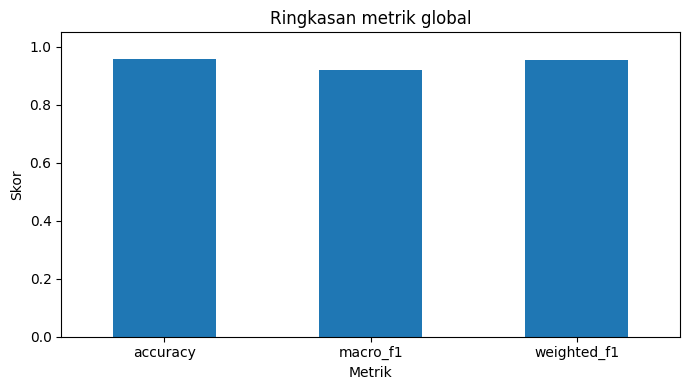

In [ ]:
labels_order = sorted(train_df["phase"].unique().tolist())

report_dict = classification_report(y_test, y_pred, output_dict=True, zero_division=0)
report_df = pd.DataFrame(report_dict).T
report_df = report_df.round(4)
display(report_df)

overall_metrics_df = pd.DataFrame({
    "metric": ["accuracy", "macro_f1", "weighted_f1"],
    "value": [
        accuracy_score(y_test, y_pred),
        f1_score(y_test, y_pred, average="macro", zero_division=0),
        f1_score(y_test, y_pred, average="weighted", zero_division=0),
    ],
})
display(overall_metrics_df.round(4))

class_metric_df = report_df.loc[[idx for idx in labels_order if idx in report_df.index], ["precision", "recall", "f1-score"]]
if len(class_metric_df) > 0:
    plt.figure(figsize=(10, 5))
    class_metric_df.plot(kind="bar", ax=plt.gca())
    plt.title("Precision, recall, dan F1-score per kelas")
    plt.xlabel("Kelas")
    plt.ylabel("Skor")
    plt.ylim(0, 1.05)
    plt.xticks(rotation=35, ha="right")
    plt.legend(title="Metrik")
    plt.tight_layout()
    plt.show()

plt.figure(figsize=(7, 4))
overall_metrics_df.plot(x="metric", y="value", kind="bar", legend=False, ax=plt.gca())
plt.title("Ringkasan metrik global")
plt.xlabel("Metrik")
plt.ylabel("Skor")
plt.ylim(0, 1.05)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


## 26. Confusion matrix dan validasi silang

Jika label yang dipakai adalah pseudo-label, baca metrik sebagai ukuran konsistensi pipeline.
Jika label yang dipakai adalah manual, metrik dapat dipakai sebagai performa klasifikasi awal.

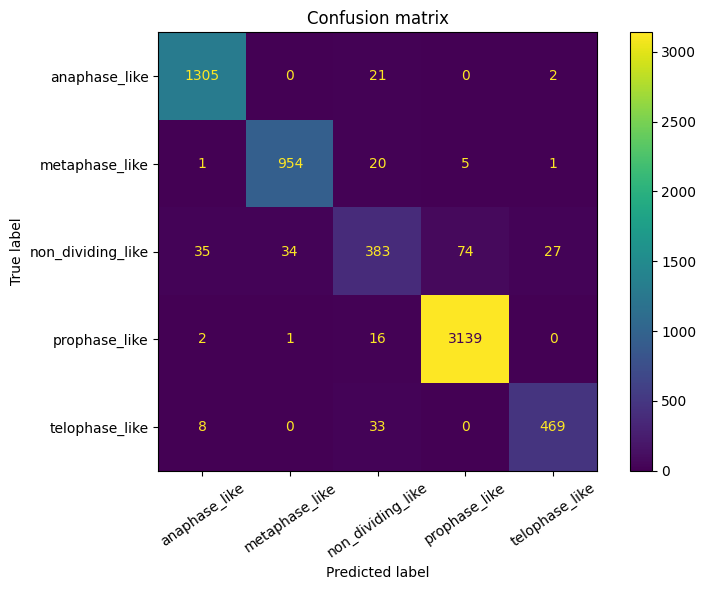

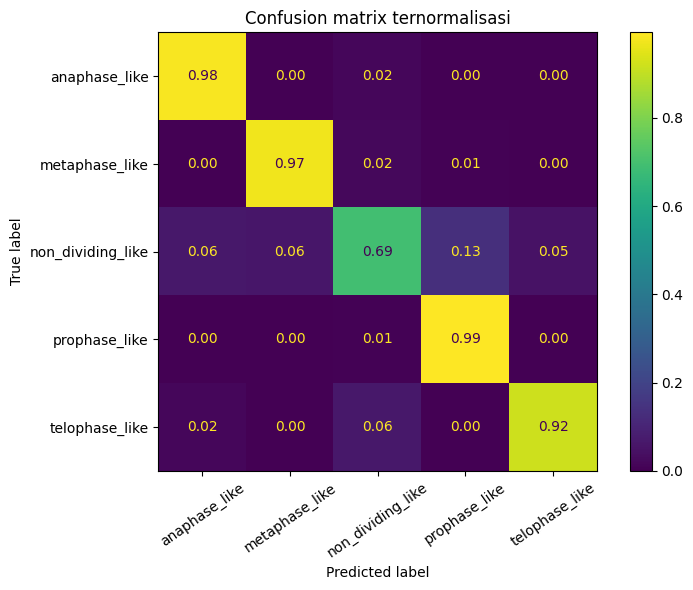

Macro F1 CV mean: 0.9241
Macro F1 CV std : 0.0013
CV scores: [0.9225 0.9262 0.924  0.9246 0.9232]


In [ ]:
cm = confusion_matrix(y_test, y_pred, labels=labels_order)

plt.figure(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels_order)
disp.plot(values_format="d", xticks_rotation=35, ax=plt.gca())
plt.title("Confusion matrix")
plt.tight_layout()
plt.show()

cm_norm = confusion_matrix(y_test, y_pred, labels=labels_order, normalize="true")
plt.figure(figsize=(8, 6))
disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=labels_order)
disp_norm.plot(values_format=".2f", xticks_rotation=35, ax=plt.gca())
plt.title("Confusion matrix ternormalisasi")
plt.tight_layout()
plt.show()

if min_class_count >= 3:
    n_splits = min(5, min_class_count)
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=RANDOM_STATE)
    cv_scores = cross_val_score(model, X, y, cv=cv, scoring="f1_macro", n_jobs=-1)
    print(f"Macro F1 CV mean: {cv_scores.mean():.4f}")
    print(f"Macro F1 CV std : {cv_scores.std():.4f}")
    print("CV scores:", np.round(cv_scores, 4))
else:
    print("Validasi silang dilewati karena jumlah sampel per kelas terlalu kecil.")


## 27. Feature importance

Bagian ini penting untuk laporan.
Feature importance menunjukkan fitur OpenCV mana yang paling berpengaruh terhadap prediksi.

,feature,importance
28,cluster_separation_norm,0.311459
23,pca_axis_ratio,0.096494
30,cluster_compactness_norm,0.081807
27,band_score,0.080572
1,chromatin_area_ratio,0.061995
0,file_size_bytes,0.031492
6,clahe_mean,0.023141
2,edge_density,0.021571
16,std_object_area_norm,0.019873
10,sharpened_mean,0.015901


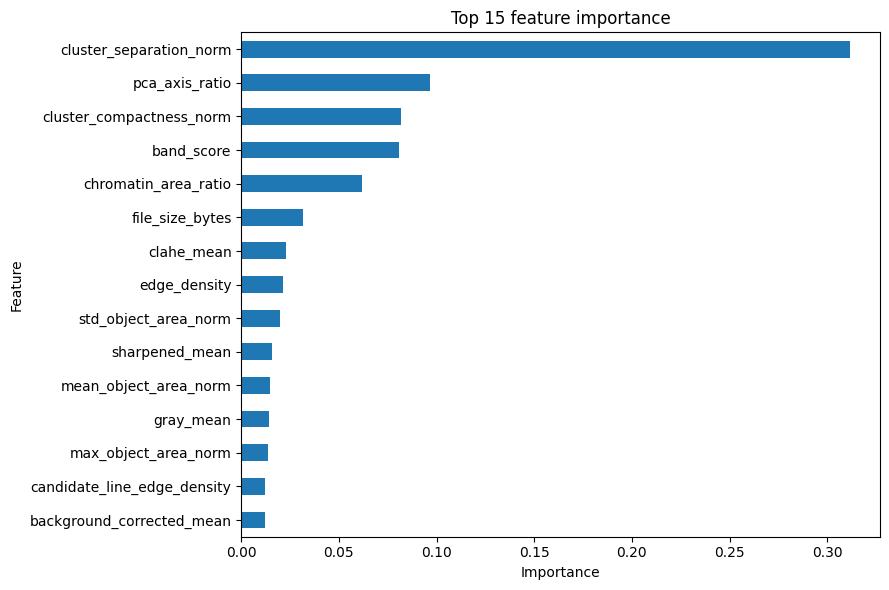

In [ ]:
rf = model.named_steps["classifier"]
importance_df = pd.DataFrame({
    "feature": feature_cols,
    "importance": rf.feature_importances_,
}).sort_values("importance", ascending=False)

display(importance_df.head(20))

plt.figure(figsize=(9, 6))
importance_df.head(15).sort_values("importance").plot(
    x="feature", y="importance", kind="barh", legend=False, ax=plt.gca()
)
plt.title("Top 15 feature importance")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


## 28. Permutation importance

Permutation importance mengukur penurunan performa ketika satu fitur diacak.
Hasil ini melengkapi feature importance bawaan Random Forest.

,feature,importance_mean,importance_std
28,cluster_separation_norm,0.434556,0.004698
23,pca_axis_ratio,0.141315,0.001959
30,cluster_compactness_norm,0.123467,0.006284
1,chromatin_area_ratio,0.073259,0.001576
27,band_score,0.040320,0.000844
0,file_size_bytes,0.022800,0.002641
5,gray_std,0.011888,0.001385
12,contrast_gain_clahe,0.009010,0.001449
16,std_object_area_norm,0.007543,0.001443
7,clahe_std,0.006839,0.001286


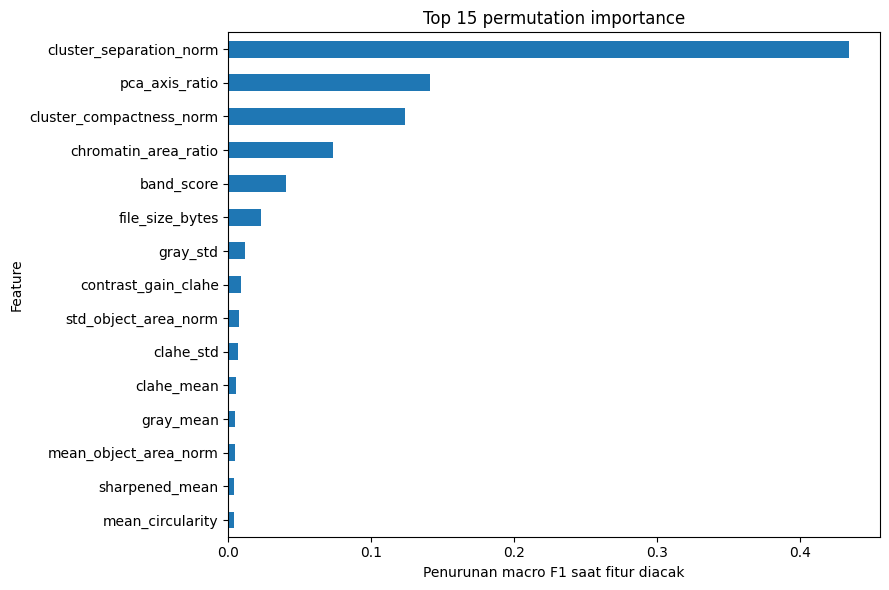

In [ ]:
permutation_df = pd.DataFrame()

if len(X_test) >= 5 and y_test.nunique() >= 2:
    try:
        perm_result = permutation_importance(
            model,
            X_test,
            y_test,
            n_repeats=5,
            random_state=RANDOM_STATE,
            scoring="f1_macro",
            n_jobs=-1,
        )

        permutation_df = pd.DataFrame({
            "feature": feature_cols,
            "importance_mean": perm_result.importances_mean,
            "importance_std": perm_result.importances_std,
        }).sort_values("importance_mean", ascending=False)

        display(permutation_df.head(20))

        plt.figure(figsize=(9, 6))
        permutation_df.head(15).sort_values("importance_mean").plot(
            x="feature", y="importance_mean", kind="barh", legend=False, ax=plt.gca()
        )
        plt.title("Top 15 permutation importance")
        plt.xlabel("Penurunan macro F1 saat fitur diacak")
        plt.ylabel("Feature")
        plt.tight_layout()
        plt.show()
    except Exception as exc:
        print("Permutation importance gagal dijalankan:", exc)
else:
    print("Permutation importance dilewati karena data uji terlalu sedikit.")


## 29. Prediksi dan visualisasi contoh hasil

Sel ini menampilkan prediksi model pada beberapa contoh citra.
Overlay menunjukkan kontur kromatin dan garis `spindle-like`.

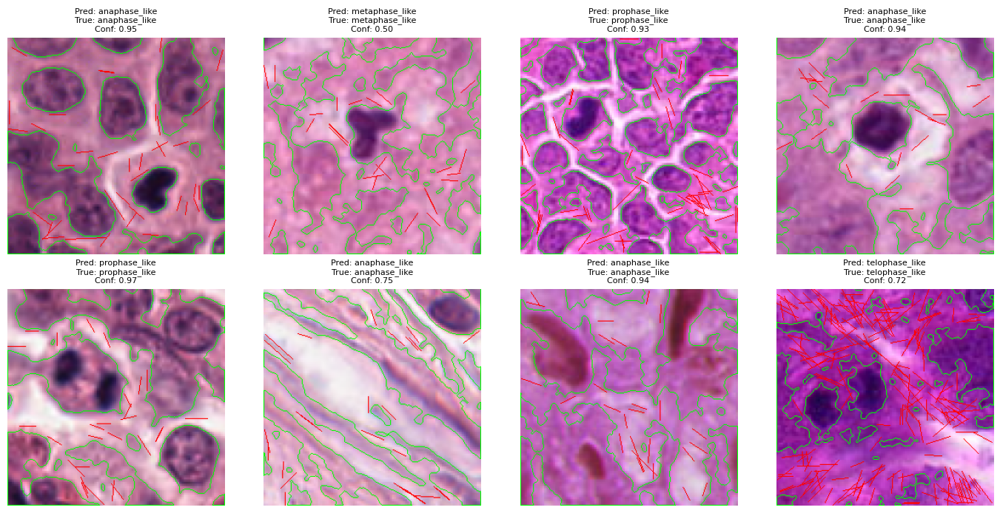

In [ ]:
def predict_single_image(image_path, trained_model=model, feature_columns=feature_cols):
    feats, artifacts = extract_spatial_features(image_path, return_artifacts=True)
    feat_df = pd.DataFrame([feats])
    feat_df = feat_df.reindex(columns=feature_columns)
    pred = trained_model.predict(feat_df)[0]

    proba_dict = {}
    if hasattr(trained_model.named_steps["classifier"], "predict_proba"):
        probs = trained_model.predict_proba(feat_df)[0]
        classes = trained_model.named_steps["classifier"].classes_
        proba_dict = {cls: float(prob) for cls, prob in zip(classes, probs)}

    return pred, proba_dict, feats, artifacts


def show_predictions(df, n=8):
    n = min(n, len(df))
    if n == 0:
        print("Tidak ada data untuk divisualisasikan.")
        return
    sample_df = df.sample(n=n, random_state=RANDOM_STATE) if len(df) > n else df.copy()
    cols = 4
    rows = int(math.ceil(n / cols))
    plt.figure(figsize=(cols * 3.5, rows * 3.5))

    for idx, (_, row) in enumerate(sample_df.iterrows(), start=1):
        pred, proba, feats, artifacts = predict_single_image(row["image_path"])
        overlay = artifacts["bgr"].copy()
        cv2.drawContours(overlay, artifacts["contours"], -1, (0, 255, 0), 1)
        for line in artifacts["lines"]:
            cv2.line(overlay, (line["x1"], line["y1"]), (line["x2"], line["y2"]), (0, 0, 255), 1)
        overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

        true_phase = row.get("phase", "unknown")
        conf = max(proba.values()) if len(proba) else np.nan
        plt.subplot(rows, cols, idx)
        plt.imshow(overlay_rgb)
        plt.title(f"Pred: {pred}\nTrue: {true_phase}\nConf: {conf:.2f}", fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_predictions(train_df.loc[idx_test], n=8)


## 30. Visualisasi prediksi salah dan confidence rendah

Bagian ini membantu analisis kualitatif.
Contoh prediksi salah dan confidence rendah sangat berguna untuk menjelaskan keterbatasan model.

Jumlah prediksi benar: 6250
Jumlah prediksi salah: 280


,image_path,file_name,source_label,phase,predicted_phase,is_correct,max_probability,proba_anaphase_like,proba_metaphase_like,proba_non_dividing_like,proba_prophase_like,proba_telophase_like
23839,/root/.cache/kagglehub/datasets/hasan1101/mito...,343.png,negative,metaphase_like,metaphase_like,True,0.904403,0.032782,0.904403,0.018554,0.020612,0.023650
12317,/root/.cache/kagglehub/datasets/hasan1101/mito...,663.png,hard,metaphase_like,metaphase_like,True,0.971766,0.012550,0.971766,0.000000,0.001064,0.014619
16701,/root/.cache/kagglehub/datasets/hasan1101/mito...,14556.png,mitotic,metaphase_like,metaphase_like,True,0.940918,0.026406,0.940918,0.001558,0.010811,0.020307
8861,/root/.cache/kagglehub/datasets/hasan1101/mito...,16261.png,hard,anaphase_like,anaphase_like,True,0.934857,0.934857,0.000000,0.000000,0.054039,0.011104
23285,/root/.cache/kagglehub/datasets/hasan1101/mito...,1227.png,negative,metaphase_like,metaphase_like,True,0.889163,0.053855,0.889163,0.012293,0.037156,0.007533


,phase,predicted_phase,count
0,anaphase_like,anaphase_like,1305
1,anaphase_like,non_dividing_like,21
2,anaphase_like,telophase_like,2
3,metaphase_like,anaphase_like,1
4,metaphase_like,metaphase_like,954
5,metaphase_like,non_dividing_like,20
6,metaphase_like,prophase_like,5
7,metaphase_like,telophase_like,1
8,non_dividing_like,anaphase_like,35
9,non_dividing_like,metaphase_like,34


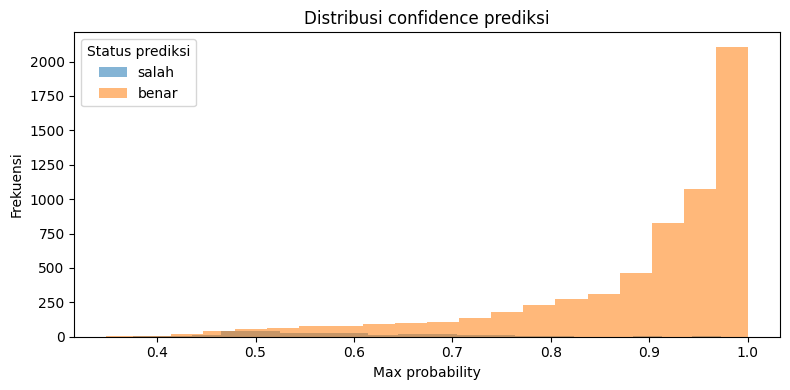

Contoh prediksi salah:


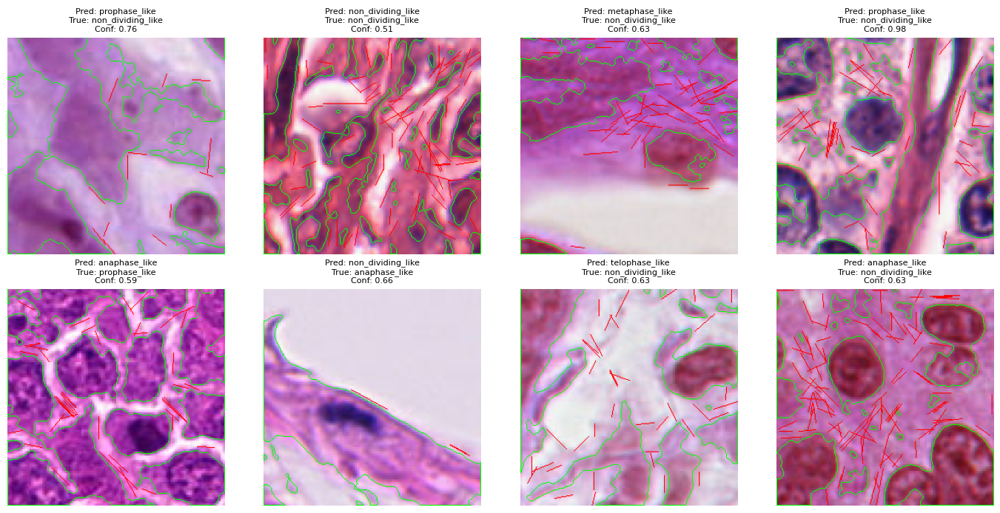

Contoh confidence terendah:


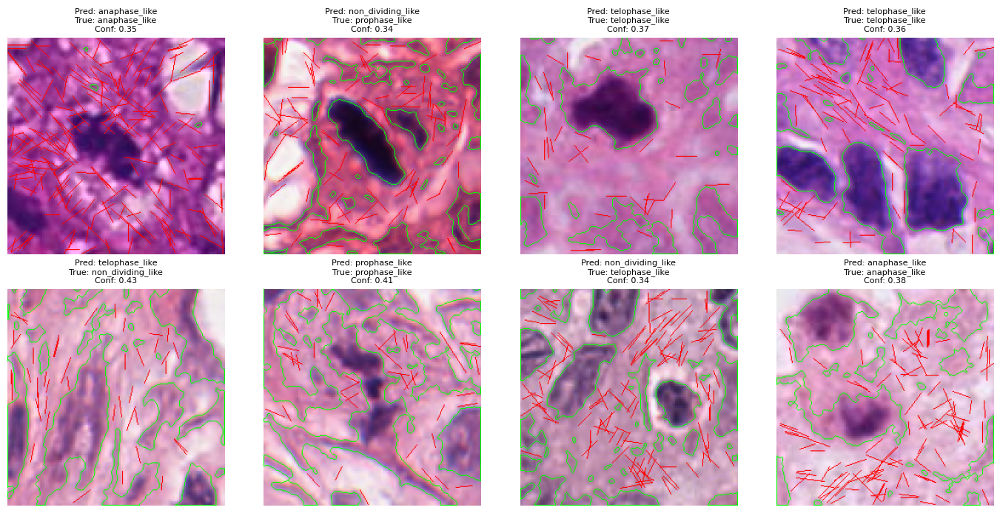

In [ ]:
prediction_audit_df = train_df.loc[idx_test, ["image_path", "file_name", "source_label", "phase"]].copy()
prediction_audit_df["predicted_phase"] = y_pred
prediction_audit_df["is_correct"] = prediction_audit_df["phase"].to_numpy() == np.array(y_pred)

if hasattr(model.named_steps["classifier"], "predict_proba"):
    proba = model.predict_proba(X_test)
    class_names = list(model.named_steps["classifier"].classes_)
    prediction_audit_df["max_probability"] = proba.max(axis=1)
    for class_idx, class_name in enumerate(class_names):
        prediction_audit_df[f"proba_{class_name}"] = proba[:, class_idx]
else:
    prediction_audit_df["max_probability"] = np.nan

print("Jumlah prediksi benar:", int(prediction_audit_df["is_correct"].sum()))
print("Jumlah prediksi salah:", int((~prediction_audit_df["is_correct"]).sum()))
display(prediction_audit_df.head())

audit_summary = prediction_audit_df.groupby(["phase", "predicted_phase"]).size().reset_index(name="count")
display(audit_summary)

if prediction_audit_df["max_probability"].notna().any():
    plt.figure(figsize=(8, 4))
    for correct_value, group in prediction_audit_df.groupby("is_correct"):
        label = "benar" if correct_value else "salah"
        plt.hist(group["max_probability"].dropna(), bins=20, alpha=0.55, label=label)
    plt.title("Distribusi confidence prediksi")
    plt.xlabel("Max probability")
    plt.ylabel("Frekuensi")
    plt.legend(title="Status prediksi")
    plt.tight_layout()
    plt.show()

misclassified_df = prediction_audit_df[~prediction_audit_df["is_correct"]]
if len(misclassified_df) > 0:
    print("Contoh prediksi salah:")
    show_predictions(misclassified_df, n=min(8, len(misclassified_df)))
else:
    print("Tidak ada prediksi salah pada data uji ini.")

if prediction_audit_df["max_probability"].notna().any():
    low_conf_df = prediction_audit_df.nsmallest(min(8, len(prediction_audit_df)), "max_probability")
    print("Contoh confidence terendah:")
    show_predictions(low_conf_df, n=len(low_conf_df))


## 31. Simpan model dan hasil prediksi

File output:

- `eda_image_metadata.csv`
- `opencv_spatial_features.csv`
- `predictions_test.csv`
- `feature_importance.csv`
- `permutation_importance.csv` jika tersedia
- `meiosis_phase_opencv_random_forest.joblib`

In [ ]:
test_result_df = prediction_audit_df.copy()

test_predictions_path = OUTPUT_DIR / "predictions_test.csv"
feature_importance_path = OUTPUT_DIR / "feature_importance.csv"
permutation_importance_path = OUTPUT_DIR / "permutation_importance.csv"
model_path = OUTPUT_DIR / "meiosis_phase_opencv_random_forest.joblib"

eda_meta_df.to_csv(OUTPUT_DIR / "eda_image_metadata.csv", index=False)
features_df.to_csv(OUTPUT_DIR / "opencv_spatial_features.csv", index=False)
test_result_df.to_csv(test_predictions_path, index=False)
importance_df.to_csv(feature_importance_path, index=False)

if isinstance(permutation_df, pd.DataFrame) and len(permutation_df) > 0:
    permutation_df.to_csv(permutation_importance_path, index=False)
    print("Permutation importance disimpan di:", permutation_importance_path.resolve())

joblib.dump({
    "model": model,
    "feature_cols": feature_cols,
    "label_mode": label_mode,
    "image_size": IMAGE_SIZE,
    "pseudo_phase_classes": PSEUDO_PHASE_CLASSES,
}, model_path)

print("Model disimpan di:", model_path.resolve())
print("Prediksi test disimpan di:", test_predictions_path.resolve())
print("Feature importance disimpan di:", feature_importance_path.resolve())


Permutation importance disimpan di: /content/outputs_meiosis_opencv/permutation_importance.csv
Model disimpan di: /content/outputs_meiosis_opencv/meiosis_phase_opencv_random_forest.joblib
Prediksi test disimpan di: /content/outputs_meiosis_opencv/predictions_test.csv
Feature importance disimpan di: /content/outputs_meiosis_opencv/feature_importance.csv


## 32. Interpretasi biologis untuk laporan

Gunakan poin berikut sebagai dasar pembahasan.
Sesuaikan dengan hasil numerik pada dataset Anda.

### 32.1. Profase-like

Kromatin mulai terkondensasi.
Pola spasial biasanya belum menunjukkan pita tengah atau pemisahan dua kutub yang jelas.
Pada fitur, kelas ini cenderung memiliki `cluster_separation_norm` sedang atau rendah.

### 32.2. Metafase-like

Kromosom cenderung tersusun pada bidang ekuator.
Pada citra 2D, pola ini diproksikan sebagai area kromatin yang memanjang, relatif tipis, dan dekat pusat.
Fitur utama yang mendukung adalah `band_score`, `pca_axis_ratio`, dan `centroid_distance_to_center_norm`.

### 32.3. Anafase-like

Kromosom bergerak ke dua kutub berlawanan.
Pada fitur, pola ini diproksikan melalui `cluster_separation_norm` tinggi dan `cluster_balance` cukup seimbang.

### 32.4. Telofase-like

Dua kelompok kromosom makin kompak di dua kutub.
Fitur yang relevan adalah `cluster_separation_norm` tinggi dan `cluster_compactness_norm` lebih rendah.

### 32.5. Non-dividing-like

Citra tidak menunjukkan pola pembelahan jelas.
Kelas ini sering muncul pada patch negatif atau area kromatin kecil.

### 32.6. Keterbatasan

1. Dataset ini bukan dataset fase meiosis berlabel asli.
2. Benang spindle biologis tidak selalu terlihat pada citra H&E.
3. Pseudo-label harus diganti dengan label manual jika ingin evaluasi biologis yang kuat.
4. Model hanya memakai fitur visual 2D, sehingga tidak dapat membedakan Meiosis I dan Meiosis II secara valid tanpa anotasi tambahan.

## 33. Bagan alir metode

```mermaid
flowchart TD
    A[Dataset citra] --> B[EDA awal dataset]
    B --> C[Preprocessing OpenCV]
    C --> D[Segmentasi kromatin]
    C --> E[Deteksi garis spindle-like]
    D --> F[Ekstraksi fitur spasial kromosom]
    E --> G[Ekstraksi fitur orientasi garis]
    F --> H[EDA fitur]
    G --> H
    H --> I{Label manual tersedia?}
    I -->|Ya| J[Gunakan label manual]
    I -->|Tidak| K[Buat pseudo-label berbasis aturan]
    J --> L[Latih Random Forest]
    K --> L
    L --> M[Evaluasi kuantitatif]
    L --> N[Visualisasi prediksi]
    M --> O[Analisis biologis]
    N --> O
```

## 34. Saran pengembangan

1. Tambahkan label manual fase meiosis dari ahli atau referensi visual yang jelas.
2. Gunakan dataset mikroskop fluoresensi yang memiliki kanal DNA dan tubulin.
3. Bandingkan fitur OpenCV dengan model CNN ringan.
4. Uji generalisasi pada data dari sumber lain.
5. Laporkan akurasi, macro F1, confusion matrix, feature importance, dan contoh salah klasifikasi.